## Imports

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import keras_cv
import keras_tuner as kt
import math
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from IPython.display import display
from IPython.display import clear_output
from PIL import ImageOps, Image
import matplotlib.pyplot as plt

import tensorflow.keras.backend as K

In [2]:
# common 
parent_dir = "/kaggle/input/airbus-ship-detection"
# images directory
train_dir = os.path.join(parent_dir, "train_v2")
# target image segmentations file
target_train = os.path.join(parent_dir, "train_ship_segmentations_v2.csv")
# test images
test_dir = os.path.join(parent_dir, "test_v2/")

## Load & Explore Data

### All util functions used for data preparation 

In [3]:
def summary_counts(df):
    counts_df = df.groupby("counts")["ImageId"].size().reset_index()
    fig = plt.figure(figsize=(11, 4))
    fig.subplots_adjust(top=0.85)
    fig.suptitle(f"Total image count: {counts_df.loc[:, 'ImageId'].sum()}", fontweight='bold')
    gs = fig.add_gridspec(1, 2, width_ratios=[3, 1])
    ax1 = fig.add_subplot(gs[0])
    ax1.bar(counts_df.loc[:, "counts"], counts_df.loc[:, "ImageId"])
    ax1.set_xlabel('Number of Targets')
    ax1.set_ylabel('Frequency')
    ax1.set_title('Targets Count per Image')
    ax1.grid(True)
    ax2 = fig.add_subplot(gs[1])
    percent = 100/len(df)
    values = [counts_df.loc[0, "ImageId"]*percent, counts_df.loc[1:, "ImageId"].sum()*percent]
    ax2.bar(["0", "1 or more"], values, width=0.1)
    ax2.set_xlabel('Number of Targets')
    ax2.set_ylabel('Percentage')
    ax2.set_title('No Target vs. Containing Target Images Counts')
    ax2.grid(True)
    plt.tight_layout()
    plt.show()
    

def plot_image_mask_pairs(image_list, rle_list, num_rows, num_cols, figsize=(12, 5)):
    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
    for i in range(num_rows):
        for j in range(num_cols):
            index = i * num_cols + j
            if index < len(image_list):
                image = plt.imread(image_list[index])
                axes[i, j].imshow(image, cmap='gray')
                mask = rle_to_mask(rle_list[index], image.shape)
                axes[i, j].imshow(mask, alpha=0.4, cmap='jet')
                axes[i, j].axis('off')
            else:
                axes[i, j].axis('off')
    plt.tight_layout()
    plt.show()
    
    
def get_single_img(path):
    return np.array(Image.open(path))


def count_values(df):
    return df.groupby("ImageId").count().value_counts().to_frame().reset_index()


def df_to_filepath(df, file_col="ImageId", parent_dir=train_dir):
    if parent_dir:
        return [os.path.join(parent_dir, image_id) for image_id in df[file_col]]
    else:
        return [row[file_col] for row in df.iterrows()]

    
def rle_to_mask(rle_list, img_shape):
    # Initialize a mask as an array full of zeros
    mask = np.zeros((img_shape[0] * img_shape[1]), dtype=np.uint8)
    if len(rle_list) > 0:
        # Iterate over each RLE string in the nested list
        for rle in rle_list:
            # Split the RLE string into individual elements
            rle_list = [int(x) for x in rle.split()]
            # Update mask values based on values extracted from the RLE string
            for i in range(0, len(rle_list), 2):
                # Extract start pixel and subtract 1 to ensure 0-indexing
                start_pixel = rle_list[i] - 1
                # Extract length value
                num_pixels = rle_list[i + 1]
                # Set the corresponding values of mask to 1s 
                mask[start_pixel:start_pixel + num_pixels] = 1
    # Reshape the mask according to the size of the original image
    return mask.reshape((img_shape[0], img_shape[1])).T


def agg_rles(rles):
    # Initialize an empty list to store grouped RLEs
    if rles.isna().any():
        return 0
    else:
        grouped_rles = []
        # Iterate over the rows of RLEs
        for rle in rles:
            # Append each RLE to the list of grouped RLEs
            grouped_rles.append(rle)
        return grouped_rles
    
    
def get_image_path_rle(df, target_dir=train_dir):
    """Extracts image paths and corresponding RLE-encoded masks from a DataFrame.

    Args:
        df (pd.DataFrame): DataFrame containing image filenames and RLE-encoded masks.
        target_dir (str): Directory containing the images. Defaults to train_dir.

    Returns:
        tuple: A tuple containing a list of image paths and a list of RLE-encoded masks.
    """
    paths = [os.path.join(target_dir, img_name) for img_name in df.iloc[:, 0]]
    rles = df.loc[:, "EncodedPixels"].tolist()
    filtered_rles = [rle if rle else [] for rle in rles]
    return paths, filtered_rles

### Data exploration

In [4]:
# load target segmentations file
segmentations = pd.read_csv(target_train)
segmentations.head(10)

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...
8,0001b1832.jpg,NaN
9,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...


In [5]:
# general data statistics
n_rows = len(segmentations)
n_images = segmentations.loc[:, "ImageId"].nunique()
no_target = segmentations[segmentations.iloc[:, 1].isna()]
target = segmentations[segmentations.iloc[:, 1].notna()]
n_unique_target = target.loc[:, "ImageId"].nunique()

print(f"Total number of data entries: {n_rows}, where:")
print(f"Total number of unique images: {n_images} (100%), where:")
print(f"\t-number of images with 1 and more targets to segment: {n_unique_target} ({round(n_unique_target/n_images, 2)*100}%)")
print(f"\t-number of images with no objects to segment: {len(no_target)} ({round(len(no_target)/n_images, 2)*100}%)")

Total number of data entries: 231723, where:
Total number of unique images: 192556 (100%), where:
	-number of images with 1 and more targets to segment: 42556 (22.0%)
	-number of images with no objects to segment: 150000 (78.0%)


### Data Transformation

In [6]:
# Group RLEs by 'ImageId' and aggregate them into lists
grouped = segmentations.groupby('ImageId')['EncodedPixels'].agg(agg_rles).to_frame().reset_index()
# cpunt the number of target objects for each image
grouped["counts"] = grouped["EncodedPixels"].apply(lambda x: x if x == 0 else len(x))
grouped

,ImageId,EncodedPixels,counts
0,00003e153.jpg,0,0
1,0001124c7.jpg,0,0
2,000155de5.jpg,[264661 17 265429 33 266197 33 266965 33 26773...,1
3,000194a2d.jpg,[360486 1 361252 4 362019 5 362785 8 363552 10...,5
4,0001b1832.jpg,0,0
...,...,...,...
192551,fffedbb6b.jpg,0,0
192552,ffff2aa57.jpg,0,0
192553,ffff6e525.jpg,0,0
192554,ffffc50b4.jpg,0,0


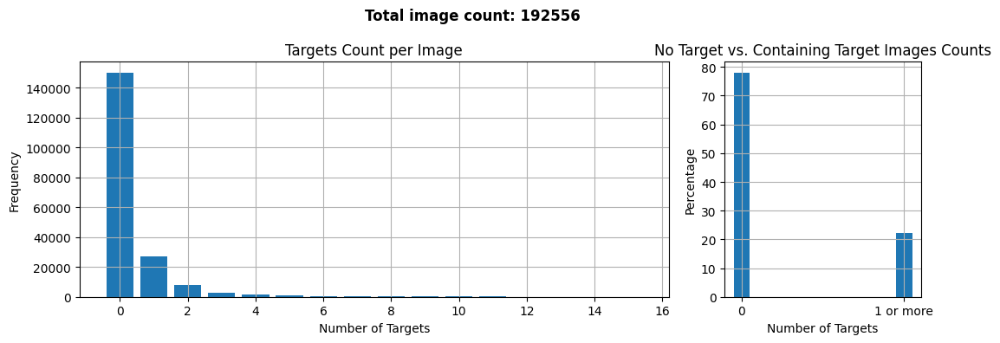

In [7]:
summary_counts(grouped)

### Visualize Images + Masks

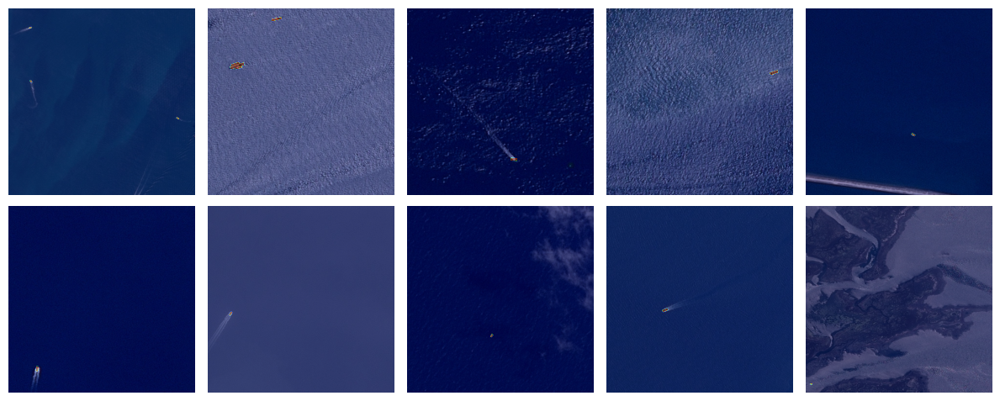

In [8]:
# load a sample of images with target and without
n_samples = 10
null_mask = grouped["EncodedPixels"] == 0
t_paths, t_rles = get_image_path_rle(grouped[~null_mask].sample(n=10))
no_t_paths, no_t_rles = get_image_path_rle(grouped[null_mask].sample(n=n_samples))

plot_image_mask_pairs(t_paths, t_rles, 2, 5)

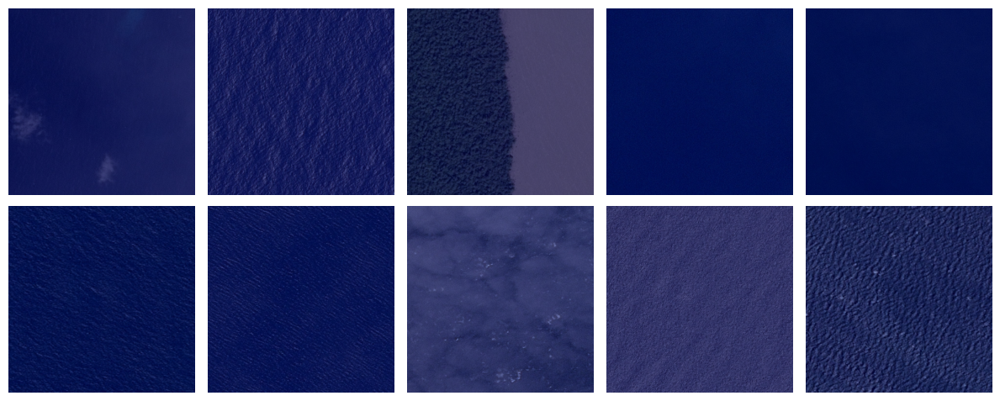

In [9]:
plot_image_mask_pairs(no_t_paths, no_t_rles, 2, 5)

## Create Datasets for Training

In [10]:
# select a subset of images with no targets and merge 2 subsets
no_target_subset = grouped[null_mask].sample(frac=0.1, random_state=42)
target_subset = grouped[~null_mask]
train_df = pd.concat([no_target_subset, target_subset])

print("Number of instances:", len(train_df))
train_df.sample(5)

Number of instances: 57556


,ImageId,EncodedPixels,counts
67293,59920fe1b.jpg,0,0
23264,1eea61b8f.jpg,[491615 1 492382 4 493150 6 493917 9 494685 11...,1
45964,3d505b408.jpg,[557297 2 558063 4 558830 6 559598 6 560367 6 ...,1
76621,65d879c1d.jpg,[287050 1 287816 4 288583 5 289349 8 290116 10...,1
159514,d43da3a2b.jpg,[578143 3 578911 7 579679 10 580446 11 581214 ...,1


Some corrupted images were found by running the following code (approximate run time: 40 minutes). Additionally, an image shape column was produced to create image masks of matching shapes. To reduce analysis and preparation time, the code was run only once, and the results were hardcoded as shown below.

```
# check for corrupted image files, add additional image shape info
# sample 1000 images 
all_paths, _ = get_image_path_rle(train_df) 
corrupted_id = []
image_shape = []
for path in all_paths:
    try:
        input_img = tf.io.read_file(path)
        input_img = tf.io.decode_jpeg(input_img)
        image_shape.append(input_img.shape)
    except tf.errors.InvalidArgumentError:
        print(path)
        index = train_df.loc[train_df.loc[:, "ImageId"] == path.split("/")[-1], "ImageId"]
        corrupted_id.extend(index)
```

In [11]:
# specify corrupted file ids if there are any
corrupted_ids = ["6384c3e78.jpg"]

# set image shape
img_shape = [(768, 768, 3)]

In [12]:
# drop corruped image rows from the dataframe
train_df = train_df.loc[~(train_df["ImageId"].isin(corrupted_ids))]
# propagate image shape information for all data records
train_df["Shape"] = len(train_df) * img_shape
print("Number of records after discarding corrupted images:", len(train_df))

Number of records after discarding corrupted images: 57556


In [13]:
# split image ids excluding images with 0 targets to segment
train_ids, valid_ids = train_test_split(
    train_df, test_size=0.1, 
    random_state=42)

print("Number of training instances:", len(train_ids))
print("Number of validation instances:", len(valid_ids))

Number of training instances: 51800
Number of validation instances: 5756


In [14]:
def rle_to_mask(rle_list, img_shape):
    """
    Calculates image mask based on its RLEs.
    
    Parameters:
    rle_list (string): image RLEs;
    img_shape (list): shape of input image.
    
    Returns: 
    array: image mask of input image shape,
    where 0 (background), 1 (target object). 
    """
    # Initialize a mask as an array full of zeros
    mask = np.zeros((img_shape[0] * img_shape[1]), dtype=np.uint8)
    if rle_list != 0:
        # Iterate over each RLE string in the nested list
        for rle in rle_list:
            # Split the RLE string into individual elements
            rle_list = [int(x) for x in rle.split()]
            # Update mask values based on values extracted from the RLE string
            for i in range(0, len(rle_list), 2):
                # Extract start pixel and subtract 1 to ensure 0-indexing
                start_pixel = rle_list[i] - 1
                # Extract length value
                num_pixels = rle_list[i + 1]
                # Set the corresponding values of mask to 1s 
                mask[start_pixel:start_pixel + num_pixels] = 1
    # Reshape the mask according to the size of the original image
    mask = mask.reshape((img_shape[0], img_shape[1])).T
    return mask

def crop_patch(image, mask, patch_size=256):
    """
    Crops symmetric patches from the input image and its mask centered around an object in the mask,
    if it exists. If no object is found in the mask, a random patch of the same size is cropped.

    Parameters:
    image (array): The input image.
    mask (array): The mask indicating the location of objects in the image.
    patch_size (int, optional): The size of the square patch to be cropped. Default is 256.

    Returns:
    tuple: A tuple containing the cropped image and its corresponding mask.
    """
    # Check if an object exists
    if tf.reduce_any(mask > 0):
        # Find indices of object pixels in the mask
        object_indices = tf.where(tf.equal(mask, 1))
        # Select a pair of indices randomly
        selected_index = tf.random.shuffle(object_indices)[0]
        # Determine the grid cell containing the selected pixel
        grid_id = (selected_index // patch_size) * patch_size
        # Set up cropping indices
        ind = [
            grid_id[0], grid_id[0] + patch_size,
            grid_id[1], grid_id[1] + patch_size
        ]
        # Crop image and its mask based on selected indices
        cropped_image = image[ind[0]:ind[1], ind[2]:ind[3], :]
        cropped_mask = mask[ind[0]:ind[1], ind[2]:ind[3], :]
    else:
        # Crop random patch from image and its mask
        cropped_image = tf.image.random_crop(image, [patch_size, patch_size, 3])
        cropped_mask = mask[:patch_size, :patch_size, :] 
    # Cropped (image, mask) pair
    return cropped_image, cropped_mask

def single_example(image_path, mask_path, patch_size, size=224):
    """
    Processes a single example for input into the model.

    This function reads an image file from the specified DataFrame row, decodes it, converts it to floating-point format,
    converts the mask from RLE format to a binary mask, crops the image and mask if a patch size is specified,
    and resizes both the image and mask to a standardized size.

    Parameters:
    row (tuple): A tuple containing information about the image file and its corresponding mask.
                 The first element is the file path of the image, and the second element is the RLE-encoded mask.
    patch_size (int): The size of the square patch to be cropped. If set to None, no cropping is performed.

    Returns:
    tuple: A tuple containing the processed input image and its corresponding mask.
    """
    # Read image file from row and decode it
    input_img = tf.io.read_file(image_path)
    input_img = tf.io.decode_jpeg(input_img)
    # Convert the image to float32 data type
    input_img = tf.image.convert_image_dtype(input_img, tf.float32)
    input_img.set_shape([None, None, 3])
    #image_shape = input_img.shape
    # Read mask for a given image
    mask = tf.io.read_file(mask_path)
    mask = tf.io.decode_png(mask) / 255
    mask.set_shape([None, None, 1])
    # If specified, crop patch from image and mask
    if patch_size:
        input_img, mask = crop_patch(input_img, mask, patch_size=patch_size)
    input_img = tf.image.resize(input_img, [size, size])
    mask = tf.image.resize(mask, [size, size])
    # return preprocessed image and mask
    return input_img, mask


def generator(paths, rles, patch_size, size):
    """
    Generates batches of preprocessed images and masks.

    Parameters:
        paths (list): List of file paths to images.
        rles (list): List of run-length encoded masks corresponding to the images.
        patch_size (int): Size of the patches to crop from the images.

    Yields:
        tuple: A tuple containing the preprocessed image and mask.
    """
    for data_row in zip(paths, rles):
        image, mask = single_example(data_row, patch_size, size)
        yield image, mask

def get_dataset(image_paths, mask_paths, patch_size=256, size=256, batch_size=32, shuffle=False):
    """
    Creates a TensorFlow dataset from image paths and RLE-encoded masks.

    Parameters:
        paths (list): A list of file paths to the images.
        rles (list): A list of RLE-encoded masks.
        patch_size (int): The size of the patches to crop.
        batch_size (int): The batch size for the dataset.

    Returns:
        tf.data.Dataset: A TensorFlow dataset object.
    """
    # Define a function to generate dataset elements
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(lambda i, m: single_example(
        i, m, patch_size=patch_size, size=size),
                         num_parallel_calls=-1)
    if shuffle:
        dataset = dataset.shuffle(16 * 100)
    return dataset.batch(batch_size, drop_remainder=True)


def get_test_image(path, size):
    """
    Reads an image file, resizes it, and scales its values to the range [-1, 1].

    Parameters:
        path (str): The path to the image file.
        size (list): The target size of the image.

    Returns:
        tf.Tensor: The processed image tensor.
    """
    input_img = tf.io.read_file(path)
    input_img = tf.io.decode_jpeg(input_img)
    input_img = tf.image.convert_image_dtype(input_img, tf.float32)
    if size:
        input_img = tf.image.resize(input_img, size) 
    input_img = input_img 
    return input_img


def get_test_dataset(directory, size=None):
    """
    Creates a TensorFlow dataset from image files in a directory for testing.

    Parameters:
        directory (str): The path to the directory containing the image files.
        size (list): The target size of the images.

    Returns:
        tf.data.Dataset: A TensorFlow dataset object.
    """
    dataset = tf.data.Dataset.list_files(str(directory + "*"))
    dataset = dataset.map(lambda x: get_test_image(x, size),
                         num_parallel_calls=tf.data.AUTOTUNE)
    return dataset


class Augment(layers.Layer):
    def __init__(self, bright_factor=0.2, seed=42, **kwargs):
        """
        Initializes the Augment layer.

        Parameters:
            bright_factor (float): The factor for adjusting brightness.
            seed (int): The seed value for random augmentation.
            **kwargs: Additional keyword arguments passed to the parent class.
        """
        super().__init__(**kwargs)
        self.hflip = layers.RandomFlip(mode="horizontal", seed=seed)
        self.vflip = layers.RandomFlip(mode="vertical", seed=seed)
        self.rotate = layers.RandomRotation(factor=0.2, seed=seed, value_range=(0, 1))
        self.bright = layers.RandomBrightness(bright_factor, value_range=(0, 1))

    def call(self, image, mask):
        """
        Applies data augmentation to the input image and mask.

        Parameters:
            image (tf.Tensor): The input image tensor.
            mask (tf.Tensor): The input mask tensor.

        Returns:
            tuple: A tuple containing the augmented image and mask tensors.
        """
        data = tf.concat([image, mask], axis=-1)
        data = self.hflip(data)
        data = self.vflip(data)
        data = self.rotate(data)
        image, mask = tf.split(data, num_or_size_splits=[image.shape[-1], mask.shape[-1]], axis=-1)
        image = self.bright(image)
        return (image, mask)

In [15]:
# put all dataframe manipulations into a single function
def get_train_val_ids(
    df, null_sample_ratio=0.1, random_state=42, corrupted_id=None, 
    img_shape=[(768, 768, 3)], test_size=0.1
):
    new_df = df.groupby('ImageId')['EncodedPixels'].agg(agg_rles).to_frame().reset_index()
    # count the number of target objects for each image
    new_df["counts"] = new_df["EncodedPixels"].apply(lambda x: x if x == 0 else len(x))
    # subsample images with no targets if needed
    if null_sample_ratio:
        null_mask = (new_df["EncodedPixels"] == 0)
        null_ids = new_df[null_mask].sample(frac=null_sample_ratio, random_state=random_state).index
        target_ids = new_df[~null_mask].index
        new_df = new_df.iloc[target_ids.append(null_ids)]
    # drop corruped image rows from the dataframe
    if corrupted_id:
        new_df = new_df.loc[~(new_df["ImageId"].isin(corrupted_ids))]
    # propagate image shape information for all data records (assuming it is the same for all the images)
    new_df["Shape"] = len(new_df) * img_shape
    # split image ids excluding images with 0 targets to segment
    train_ids, valid_ids = train_test_split(new_df, test_size=test_size, random_state=random_state)
    return train_ids, valid_ids

In [16]:
# create image masks
def save_masks(df, save_dir_path=None):
    mask_ids = []
    for i, row in df.iterrows():
        # parse a row values
        img_id, rle, img_shape = row["ImageId"], row["EncodedPixels"], row["Shape"]
        if rle != 0:
            # create a mask by passing RLE and image shape
            mask = rle_to_mask(rle, img_shape) 
        else:
            mask = np.zeros((img_shape[0], img_shape[1]), dtype=np.uint8)
        name, ext = img_id.split(".")
        if save_dir_path:
            os.makedirs(save_dir_path, exist_ok=True)
            mask_id = os.path.join(save_dir_path, name + "_mask" + ".jpg")
        else:
            mask_id = name + "_mask" + ".jpg" 
        mask = Image.fromarray(mask*255)
        if not os.path.exists(mask_id):
            mask.save(mask_id)
        mask_ids.append(mask_id)
    return mask_ids


def get_image_mask_path(df, image_dir, mask_dir):
    image_paths = [os.path.join(image_dir, img_name) for img_name in df.loc[:, "ImageId"]]
    mask_paths = [os.path.join(mask_dir, img_name) for img_name in df.loc[:, "MaskId"]]
    return image_paths, mask_paths

In [17]:
# create and save masks for images that will be used in the training process
train_ids, valid_ids = get_train_val_ids(segmentations, null_sample_ratio=0.1, corrupted_id=corrupted_ids)

# save masks, get their ids
train_mask_ids = save_masks(train_ids, "train_masks")
valid_mask_ids = save_masks(valid_ids, "valid_masks")

# add saved mask names information for each corresponding image to the DataFrame
train_ids["MaskId"] = train_mask_ids
valid_ids["MaskId"] = valid_mask_ids

In [ ]:
batch_size = 64
patch_size = None
size = 256
mask_dir = "/kaggle/working"

train_image_paths, train_mask_paths = get_image_mask_path(train_ids, image_dir=train_dir, mask_dir=mask_dir)
valid_image_paths, valid_mask_path = get_image_mask_path(valid_ids, image_dir=train_dir, mask_dir=mask_dir)

# get batched training set
train_ds = get_dataset(train_image_paths, train_mask_paths, patch_size=patch_size, size=size, batch_size=batch_size, shuffle=True)
train_ds = train_ds.map(
    Augment(), 
    num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE).repeat()

# prepare validation set normally
valid_ds = get_dataset(valid_image_paths, valid_mask_path, patch_size=patch_size, size=size, batch_size=batch_size)
valid_ds = valid_ds.prefetch(tf.data.AUTOTUNE)

#### Show prepared images

Image min/max values: 0.15461625 0.9623859
Mask min/max values: 0.0 1.0


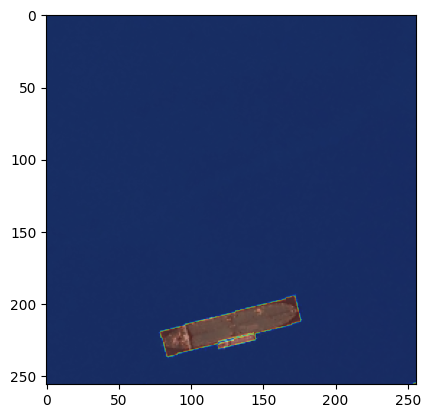

Image min/max values: 0.12399955 1.0
Mask min/max values: 0.0 1.0


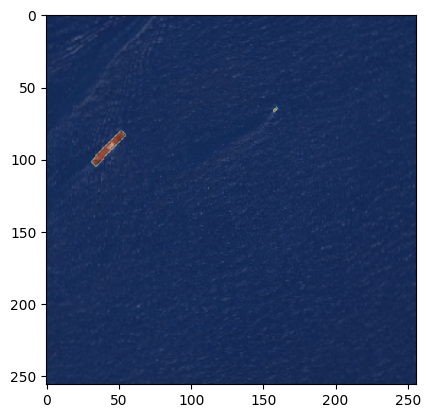

In [19]:
for image, mask in train_ds.unbatch().take(2):
    print("Image min/max values:", tf.reduce_min(image).numpy(), tf.reduce_max(image).numpy())
    print("Mask min/max values:", tf.reduce_min(mask).numpy(), tf.reduce_max(mask).numpy())
    plt.imshow(image, cmap='gray')
    plt.imshow(mask, alpha=0.4, cmap='jet')
    plt.show()

Image min/max values: 0.0 1.0
Mask min/max values: 0.0 1.0


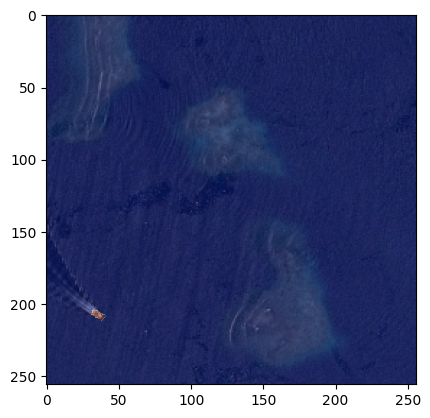

In [20]:
for image, mask in valid_ds.unbatch().take(1):
    print("Image min/max values:", tf.reduce_min(image).numpy(), tf.reduce_max(image).numpy())
    print("Mask min/max values:", tf.reduce_min(mask).numpy(), tf.reduce_max(mask).numpy())
    plt.imshow(image, cmap='gray')
    plt.imshow(mask, alpha=0.4, cmap='jet')
    plt.show()

## Loss Function

- **Evaluation metric**: Dice Score;
- **Loss**: Symmetric Unified Focal Loss (custom implementation from a paper *https://arxiv.org/pdf/2102.04525*).

In [18]:
#@keras.utils.register_keras_serializable()
class SymmetricUnifiedFocalLoss(keras.losses.Loss):
    """
    Symmetric Unified Focal Loss function combining the modified Focal loss and modified Focal Tversky loss.
    
    This loss function combines the Dice Loss and Binary Focal Loss to address
    class imbalance and pixel-wise segmentation accuracy in semantic segmentation
    tasks. The Dice Loss measures the overlap between predicted and ground truth
    masks, while the Binary Focal Loss penalizes false positives and false negatives.

    Args:
        lmbd (float): Weighting factor for combining the modified Focal loss and modified Focal Tversky loss.
        delta (float): Weighting factor of false positives (FP) and false negatives (FN) in the Tversky index.
        gamma (float): Focusing parameter for the modified Focal Loss.
        name (str): Optional name for the loss function.
    """
    def __init__(self, lmbd=0.5, delta=0.6, gamma=2.0, name="symmetric_focal_tversky_loss", **kwargs):
        super().__init__(name=name, **kwargs)
        self.lmbd = lmbd
        self.delta = delta
        self.gamma = gamma

    def modified_tversky_index(self, y_true, y_pred):
        y_true = K.flatten(y_true)
        y_pred = K.flatten(y_pred)
        TP = tf.reduce_sum(y_true * y_pred)
        FN = tf.reduce_sum(y_true * (1. - y_pred))
        FP = tf.reduce_sum((1. - y_true) * y_pred)
        return tf.reduce_mean(TP / (TP + self.delta * FN + (1 - self.delta) * FP))

    def modified_tversky_loss(self, y_true, y_pred):
        return 1. - self.modified_tversky_index(y_true, y_pred)

    def modified_focal_tversky_loss(self, y_true, y_pred):
        return tf.math.pow((1. - self.modified_tversky_index(y_true, y_pred)), self.gamma)

    def bce(self, y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, K.epsilon(), 1. - K.epsilon())
        loss = tf.reduce_sum(tf.reduce_mean(tf.math.log(y_pred) * y_true + tf.math.log(1. - y_pred) * (1. - y_true)))
        return -loss

    def modified_focal_loss(self, y_true, y_pred):
        bce_loss = self.bce(y_true, y_pred)
        y_pred = tf.clip_by_value(y_pred, K.epsilon(), 1. - K.epsilon())
        mod_focal = self.delta * tf.math.pow((1 - y_pred), (1 - self.gamma)) * bce_loss
        return mod_focal

    def call(self, y_true, y_pred):
        mFT = self.modified_focal_tversky_loss(y_true=y_true, y_pred=y_pred)
        mF = self.modified_focal_loss(y_true, y_pred)
        mUF = self.lmbd * mF + (1. - self.lmbd) * mFT
        return mUF

    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "lmbd": self.lmbd, "delta": self.delta, "gamma": self.gamma}
    

#@keras.utils.register_keras_serializable()   
def dice_score(y_true, y_pred):
    """"
    Computes the Dice similarity coefficient metric for semantic segmentation.
    
    The Dice coefficient measures the similarity between predicted and ground
    truth masks. It is defined as twice the intersection of the predicted and
    ground truth masks divided by the sum of their sizes.
    """
    smooth = 1e-5
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    mask_sum = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    score = (2.0 * intersection + smooth) / (mask_sum + smooth)
    return tf.reduce_mean(score)

### Loss plot

In [22]:
# the space of possible predictions for a data instance
y_pred = np.linspace(0.001, 0.999, 100)
# true label of the data instance
y_true = np.ones(100)
# range of possible gamma values
gammas = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
# measure the loss given different gammas
gamma_loss = []
for gamma in gammas:
    suft_loss = SymmetricUnifiedFocalLoss(gamma=gamma)
    losses = []
    for i in range(len(y_pred)):
        losses.append(suft_loss(y_true[i], y_pred[i]).numpy())
    gamma_loss.append(losses)

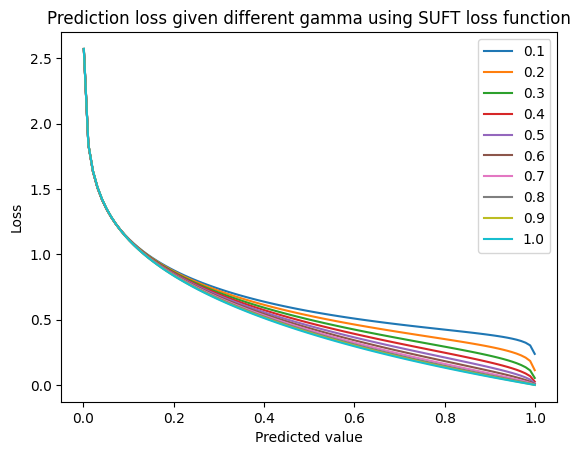

In [23]:
# plot the result
for i in range(len(gammas)):
    plt.plot(y_pred, gamma_loss[i], label=gammas[i])
plt.title("Prediction loss given different gamma using SUFT loss function")
plt.xlabel("Predicted value")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Model design

- Base Model: MobileNetV2 
- Segmentation Model: converted base model into U-Net-like architecture 

In [19]:
# MobileNet model + classification head for pretraining
def MobileNetV2Encoder(input_shape=[None, None, 3]):
    backbone = keras.applications.MobileNetV2(input_shape=input_shape, weights="imagenet", include_top=False)
    backbone.trainable = True
    for layer in backbone.layers:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False
    features = keras.layers.Flatten()(backbone.output)
    output = keras.layers.Dense(1, activation="sigmoid", dtype="float32")(features)
    model = keras.Model(inputs=[backbone.input], outputs=[output])
    return model

@keras.utils.register_keras_serializable()
class Upsample(keras.layers.Layer):
    """
    Upsampling layer for the UNetMobile model.

    This layer performs convolutional transpose followed by batch normalization,
    dropout (optional), and ReLU activation.

    Args:
        filters (int): Number of filters in Conv2DTranspose.
        size (int or tuple of int): Size of the Conv2DTranspose convolutional kernel.
        name (str): Optional name for the layer.
        use_dropout (bool): Whether to apply dropout. Defaults to False.
    """
    def __init__(self, filters, size, name, use_dropout=False, **kwargs):
        super().__init__(name=name, **kwargs)
        self.filters = filters
        self.size = size
        self.use_dropout = use_dropout
        self.conv_transpose = layers.Conv2DTranspose(
            filters=self.filters, kernel_size=self.size, strides=2, 
            kernel_initializer=tf.random_normal_initializer(0., 0.02),
            use_bias=False, padding="same")
        self.batch_norm = layers.BatchNormalization()
        if self.use_dropout:
            self.dropout = layers.Dropout(rate=0.5)
        self.relu = layers.ReLU()
   
    def call(self, inputs):
        x = self.conv_transpose(inputs)
        x = self.batch_norm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.relu(x)
        return x
        
    def get_config(self):
        return dict(filters=self.filters, size=self.size, 
                    use_dropout=self.use_dropout, **super().get_config())

@keras.utils.register_keras_serializable()
class UNetMobileV2(keras.Model):
    """
    UNetMobile model for semantic segmentation.

    This model extends MobileNetV2 and adds upsampling layers for segmentation.

    Args:
        input_shape (list): Input shape of the model. Defaults to [224, 224, 3].
        output_channels (int): Number of output masks (classes to predict). Defaults to 1.
        name (str): Optional name for the model.
    """
    def __init__(
        self, input_shape, pretrained_encoder_path=None, base_trainable=False, 
        output_channels=1, name="unet_mobile", **kwargs
    ):
        super().__init__(name=name, **kwargs)
        self.output_channels = output_channels
        self._input_shape = input_shape
        self.layer_to_reuse = [
            'block_1_expand_relu',   # 64x64
            'block_3_expand_relu',   # 32x32
            'block_6_expand_relu',   # 16x16
            'block_13_expand_relu',  # 8x8
            'block_16_project',      # 4x4
        ]
        
        # Load pretrained model if a path is passed, discard top layers
        if pretrained_encoder_path:
            model = keras.models.load_model(pretrained_encoder_path, compile=False)
            self.base_model = keras.Model(inputs=[model.input], outputs=[model.layers[-3].output])
        
        # If no path is specified, load MobileNetV2 from keras applications package
        else: 
            self.base_model = keras.applications.MobileNetV2(
                input_shape=input_shape, weights="imagenet", include_top=False
            )
        
        # Get required to reuse outputs from the layers 
        self.base_model_outputs = [self.base_model.get_layer(name).output for name in self.layer_to_reuse]
        
        # Image downsampling path
        self.down_stack = keras.Model(inputs=self.base_model.input, outputs=self.base_model_outputs)
        
        # Freeze the weights of the base model
        self.down_stack.trainable = base_trainable
        
        # Define upsampling layers
        self.n_filters = [512, 256, 128, 64]
        params = [(f, 3, f"upsample_{f}") for f in self.n_filters]
        self.up_stack = [Upsample(*p_set) for p_set in params]
        
        # Define the last convolutional layer
        self.last_conv = layers.Conv2DTranspose(
            filters=output_channels, kernel_size=3, strides=2,
            padding='same', activation="sigmoid", dtype='float32')

            
    def call(self, inputs):
        # Connect downsampling and upsampling layers into a model
        x = self.down_stack(inputs)
        skips = reversed(x[:-1])
        x = x[-1]
        for up, skip in zip(self.up_stack, skips):
            x = up(x)
            concat = layers.Concatenate()
            x = concat([x, skip])
        x = self.last_conv(x)
        return x
    
    def summary(self):
        # Get model summary along with output shapes and number of parameters
        x = keras.Input(shape=self._input_shape)
        model = keras.Model(inputs=[x], outputs=self.call(x))
        return model.summary()
    
    def get_config(self):
        return dict(
            input_shape=self._input_shape,
            output_channels=self.output_channels,
            **super().get_config())

    
# Create an instance of the UNetModel with specified output channels
#model = UNetMobileV2(input_shape=[None, None, 3])
#model.summary()

## Model Pretraining

- Stage 1: base model (MobileNetV2Encoder) pretrained on the classification task (Ship/No Ship);
- Stage 2: base model converted into segmentation model and trained further on the segmentation task;

### Utility Functions

In [20]:
# Learning Rate Finder
class ExponentialLearningRate(tf.keras.callbacks.Callback):
    def __init__(self, factor):
        self.factor = factor
        self.rates = []
        self.losses = []

    def on_epoch_begin(self, epoch, logs=None):
        self.sum_of_epoch_losses = 0

    def on_batch_end(self, batch, logs=None):
        mean_epoch_loss = logs["loss"]  # the epoch's mean loss so far 
        new_sum_of_epoch_losses = mean_epoch_loss * (batch + 1)
        batch_loss = new_sum_of_epoch_losses - self.sum_of_epoch_losses
        self.sum_of_epoch_losses = new_sum_of_epoch_losses
        self.rates.append(model.optimizer.variables[1].numpy())
        self.losses.append(batch_loss)
        model.optimizer.variables[1].assign(model.optimizer.variables[1].numpy() * self.factor)
    
        
def find_learning_rate(model, X, epochs=1, batch_size=32, train_size=None, min_rate=1e-6, max_rate=1):
    init_weights = model.get_weights()
    if train_size:
        iterations = math.ceil(train_size / batch_size) * epochs
    else:
        iterations = math.ceil(X.unbatch().cardinality() / batch_size) * epochs
    factor = (max_rate / min_rate) ** (1 / iterations)
    init_lr = model.optimizer.variables[1].numpy()
    model.optimizer.variables[1].assign(min_rate)
    exp_lr = ExponentialLearningRate(factor)
    history = model.fit(X, epochs=epochs, steps_per_epoch=iterations-1, batch_size=batch_size,
                        callbacks=[exp_lr])
    model.optimizer.variables[1].assign(init_lr)
    return exp_lr.rates, exp_lr.losses

def plot_lr_vs_loss(rates, losses):
    plt.plot(rates, losses, "b")
    plt.gca().set_xscale('log')
    max_loss = losses[0] + min(losses)
    plt.hlines(min(losses), min(rates), max(rates), color="k")
    plt.axis([min(rates), max(rates), 0, max_loss])
    plt.xlabel("Learning rate")
    plt.ylabel("Loss")
    plt.grid()
    

# Learning Rate Scheduler
@keras.utils.register_keras_serializable()
class TriangularScheduler(keras.optimizers.schedules.LearningRateSchedule):
    """Linear ramp up for 'warmup' steps, then linear decay to 0 at 'total steps'."""
    def __init__(self, rate, warmup, total):
        self.rate = rate
        self.warmup = warmup
        self.total = total

    def get_config(self):
        config = {"rate": self.rate, "warmup": self.warmup, "total": self.total}
        return config

    def __call__(self, step):
        step = tf.cast(step, dtype="float32")
        rate = tf.cast(self.rate, dtype="float32")
        warmup = tf.cast(self.warmup, dtype="float32")
        total = tf.cast(self.total, dtype="float32")

        warmup_rate = rate * step / self.warmup
        cooldown_rate = rate * (total - step) / (total - warmup)
        triangular_rate = tf.math.minimum(warmup_rate, cooldown_rate)
        return tf.math.maximum(triangular_rate, 1e-7)
    
    
# Callback for model training progress display
def _display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def _show_predictions(dataset=None, num=1):
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            _display([image[0], mask[0], create_mask(pred_mask)])
    else:
        _display([sample_image, sample_mask, 
                 model.predict(tf.expand_dims(sample_image, axis=0))[0]])
        
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        clear_output(wait=True)
        _show_predictions()
        print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

### Classification Pretraining (Ship-No-Ship)

1. Prepare the data: 
    - the number of background images (no targets) for classiification pretraining task is increased to match the number of images containing targets;
    - masks converted to class labels: 0 ("no ship") / 1 ("ship");
2. Find optimal pretraining learining rate
3. Pretrain the model
4. Save the best model

In [29]:
batch_size = 64
patch_size = None
size = 256
mask_dir = "/kaggle/working"

train_ids, valid_ids = get_train_val_ids(segmentations, null_sample_ratio=0.7, corrupted_id=corrupted_ids)

train_mask_ids = save_masks(train_ids, "train_masks")
valid_mask_ids = save_masks(valid_ids, "valid_masks")

train_ids["MaskId"] = train_mask_ids
valid_ids["MaskId"] = valid_mask_ids

train_image_paths, train_mask_paths = get_image_mask_path(train_ids, image_dir=train_dir, mask_dir=mask_dir)
valid_image_paths, valid_mask_path = get_image_mask_path(valid_ids, image_dir=train_dir, mask_dir=mask_dir)

# get batched training set
train_ds = get_dataset(train_image_paths, train_mask_paths, patch_size=patch_size, size=size, batch_size=batch_size, shuffle=True)
train_ds = train_ds.map(
    Augment(), 
    num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE).repeat()

# prepare validation set normally
valid_ds = get_dataset(valid_image_paths, valid_mask_path, patch_size=patch_size, size=size, batch_size=batch_size)
valid_ds = valid_ds.prefetch(tf.data.AUTOTUNE)

In [30]:
# transform image masks into labels 
train_ds = train_ds.unbatch().map(lambda image, mask: (image, tf.reduce_max(mask))).batch(batch_size)
valid_ds = valid_ds.unbatch().map(lambda image, mask: (image, tf.reduce_max(mask))).batch(batch_size)

/tmp/ipykernel_34/1331907227.py:3: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  backbone = keras.applications.MobileNetV2(input_shape=input_shape, weights="imagenet", include_top=False)
I0000 00:00:1724141345.773976     110 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


299/299 ━━━━━━━━━━━━━━━━━━━━ 269s 694ms/step - binary_accuracy: 0.7638 - loss: 104.6713


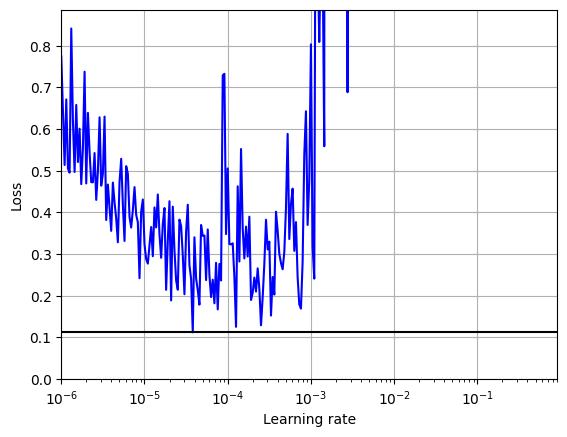

In [31]:
# find optimal learning rate for pretraining
model = MobileNetV2Encoder(input_shape=[256, 256, 3])
optimizer = keras.optimizers.Adam(1e-3)
model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=["binary_accuracy"])
rates, losses = find_learning_rate(model, train_ds.take(300), epochs=1, train_size=300*64,
                                   batch_size=batch_size, min_rate=1e-6, max_rate=1)
plot_lr_vs_loss(rates, losses) 

In [32]:
epochs = 5
steps_per_epoch = len(train_image_paths) // batch_size

model_path = "models/classifier.keras"
checkpoint = keras.callbacks.ModelCheckpoint(
    model_path, monitor='val_binary_accuracy', 
    verbose=1, save_best_only=True, mode='max')
e_stop = keras.callbacks.EarlyStopping(
    monitor="val_binary_accuracy", mode="max", patience=3)
callbacks = [checkpoint, e_stop]

model = MobileNetV2Encoder(input_shape=[256, 256, 3])
optimizer = keras.optimizers.Adam(1e-4)
model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=["binary_accuracy"])
history = model.fit(
    train_ds,
    steps_per_epoch=steps_per_epoch,
    epochs=epochs,
    validation_data=valid_ds,
    batch_size=batch_size,
    callbacks=callbacks,
)

/tmp/ipykernel_34/1331907227.py:3: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  backbone = keras.applications.MobileNetV2(input_shape=input_shape, weights="imagenet", include_top=False)


Epoch 1/5
2075/2075 ━━━━━━━━━━━━━━━━━━━━ 0s 681ms/step - binary_accuracy: 0.8778 - loss: 0.2197
Epoch 1: val_binary_accuracy improved from -inf to 0.94640, saving model to models/classifier.keras
2075/2075 ━━━━━━━━━━━━━━━━━━━━ 1510s 717ms/step - binary_accuracy: 0.8778 - loss: 0.2197 - val_binary_accuracy: 0.9464 - val_loss: 0.1377
Epoch 2/5
2075/2075 ━━━━━━━━━━━━━━━━━━━━ 0s 646ms/step - binary_accuracy: 0.8993 - loss: 0.1385
Epoch 2: val_binary_accuracy did not improve from 0.94640
2075/2075 ━━━━━━━━━━━━━━━━━━━━ 1421s 685ms/step - binary_accuracy: 0.8993 - loss: 0.1385 - val_binary_accuracy: 0.9368 - val_loss: 0.1508
Epoch 3/5
2075/2075 ━━━━━━━━━━━━━━━━━━━━ 0s 701ms/step - binary_accuracy: 0.9017 - loss: 0.1285
Epoch 3: val_binary_accuracy did not improve from 0.94640
2075/2075 ━━━━━━━━━━━━━━━━━━━━ 1520s 733ms/step - binary_accuracy: 0.9017 - loss: 0.1285 - val_binary_accuracy: 0.9452 - val_loss: 0.1308
Epoch 4/5
2075/2075 ━━━━━━━━━━━━━━━━━━━━ 0s 694ms/step - binary_accuracy: 0.9026 -

### Segmentation Pretraining

1. Prepare the data: 
    - reduce the number of background images;
    - create training/validation datasets while resizing images and masks to 256x256 size;
2. Tune Loss hyperparameters (using Keras Tuner)
3. Find an optimal pretraining LR, set up the LR scheduler;
4. Pretrain the segmentation model (to give the upsampling path a general understanding of the data, while keeping downsampling path frozen in order to avoid breaking pretrained on the classification task weights).
5. Save the best model

In [33]:
batch_size = 64
patch_size = None
size = 256
mask_dir = "/kaggle/working"

# reduce number of images with no ships in order to save computations
train_ids, valid_ids = get_train_val_ids(segmentations, null_sample_ratio=0.1, corrupted_id=corrupted_ids)
 
train_mask_ids = save_masks(train_ids, "train_masks")
valid_mask_ids = save_masks(valid_ids, "valid_masks")

train_ids["MaskId"] = train_mask_ids
valid_ids["MaskId"] = valid_mask_ids

train_image_paths, train_mask_paths = get_image_mask_path(train_ids, image_dir=train_dir, mask_dir=mask_dir)
valid_image_paths, valid_mask_path = get_image_mask_path(valid_ids, image_dir=train_dir, mask_dir=mask_dir)

# get batched training set
train_ds = get_dataset(train_image_paths, train_mask_paths, patch_size=patch_size, size=size, batch_size=batch_size, shuffle=True)
train_ds = train_ds.map(
    Augment(), 
    num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE).repeat()

# prepare validation set normally
valid_ds = get_dataset(valid_image_paths, valid_mask_path, patch_size=patch_size, size=size, batch_size=batch_size)
valid_ds = valid_ds.prefetch(tf.data.AUTOTUNE)

In [34]:
gamma_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

def create_model(gamma):
    model = UNetMobileV2(input_shape=[None, None, 3], 
                         pretrained_encoder_path="models/classifier.keras")
    loss = SymmetricUnifiedFocalLoss(gamma=gamma)
    model.compile(optimizer='adam', loss=loss, metrics=[dice_score])
    return model

def model_builder(hp):
    gamma = hp.Choice('gamma', values=[0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8])
    model = create_model(gamma)
    return model

# Instantiate the tuner
tuner = kt.Hyperband(
    model_builder,
    objective=kt.Objective("val_dice_score", direction="max"),
    max_epochs=4,
    factor=3,
    directory='my_dir',
    project_name='loss_tuning'
)

# Early stopping callback to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

# Perform the hyperparameter search
tuner.search(train_ds.take(300), validation_data=valid_ds, epochs=30, steps_per_epoch=300, callbacks=[early_stopping])

Trial 9 Complete [00h 08m 53s]
val_dice_score: 0.7495903968811035

Best val_dice_score So Far: 0.7624697089195251
Total elapsed time: 00h 54m 37s


In [35]:
best_model = tuner.get_best_models(num_models=1)[0]
tuned_gamma = best_model.loss.gamma
print(tuned_gamma)

0.5


In [21]:
tuned_gamma = 0.5

299/299 ━━━━━━━━━━━━━━━━━━━━ 208s 636ms/step - dice_score: 0.1312 - loss: 0.5687


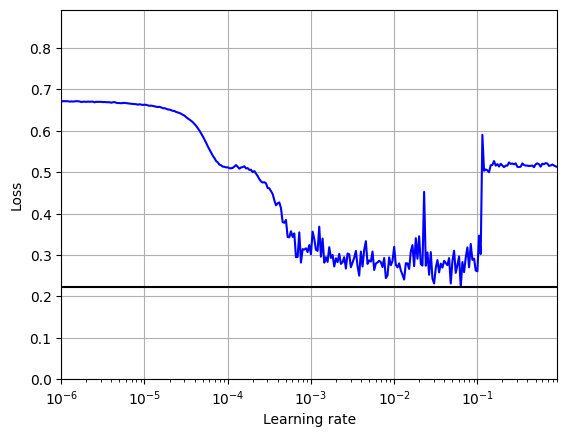

In [37]:
# find optimal learning rate for pretraining
model = UNetMobileV2(input_shape=[None, None, 3], 
                     pretrained_encoder_path="models/classifier.keras")
optimizer = keras.optimizers.Adam(1e-3)
model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer=optimizer, metrics=[dice_score])
rates, losses = find_learning_rate(model, train_ds.take(300), epochs=1, 
                                   batch_size=batch_size, min_rate=1e-6, max_rate=1)
plot_lr_vs_loss(rates, losses) 

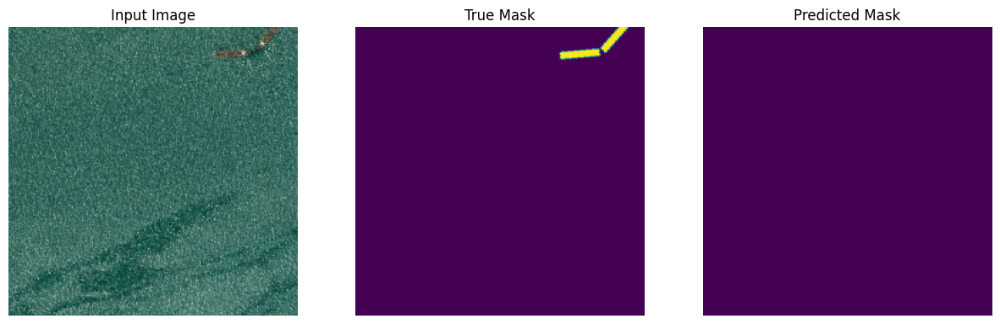

In [38]:
# sample image and mask to display model predictions during training
for item in train_ds.unbatch().take(1):
    sample_image, sample_mask = item[0], item[1]
_display([sample_image, sample_mask, model.predict(tf.expand_dims(sample_image, axis=0), verbose=0)[0]])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


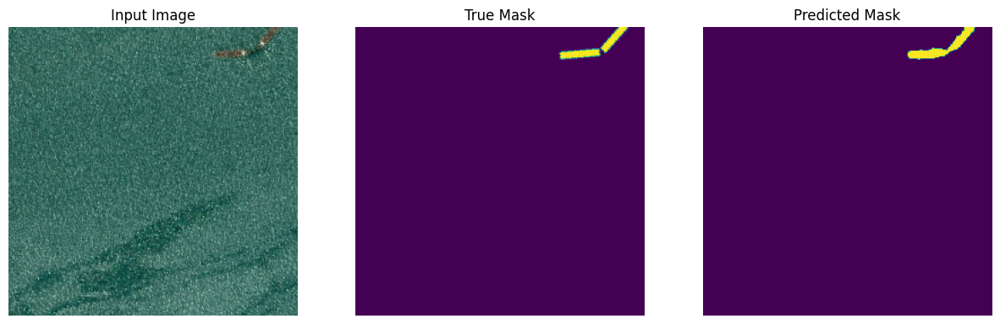


Sample Prediction after epoch 10

809/809 ━━━━━━━━━━━━━━━━━━━━ 801s 991ms/step - dice_score: 0.7920 - loss: 0.2283 - val_dice_score: 0.8067 - val_loss: 0.2211


In [39]:
# create LR scheduling
epochs = 10
batch_size = 64
steps_per_epoch = len(train_image_paths) // batch_size
num_train_steps = steps_per_epoch * epochs
warmup_steps = int(0.1 * num_train_steps)
initial_learning_rate = 1e-2
warmup_schedule = TriangularScheduler(initial_learning_rate, warmup_steps, num_train_steps)

# callback to save model along the way
model_path = "models/segmentator_pretrained.keras"
checkpoint = keras.callbacks.ModelCheckpoint(
    model_path, monitor='val_dice_score', 
    verbose=1, save_best_only=True, mode='max')
e_stop = keras.callbacks.EarlyStopping(
    monitor="val_dice_score", mode="max", patience=3)
callbacks = [checkpoint, e_stop, DisplayCallback()]

# train model 
model = UNetMobileV2(input_shape=[None, None, 3], 
                     pretrained_encoder_path="models/classifier.keras")
optimizer = keras.optimizers.Adam(learning_rate=warmup_schedule)
model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer=optimizer, metrics=[dice_score])
history = model.fit(
    train_ds,
    steps_per_epoch=steps_per_epoch,
    epochs=epochs,
    validation_data=valid_ds,
    batch_size=batch_size,
    callbacks=callbacks,
)

## Model Fine-Tuning

### Fine-Tuning (384x384)

1. Prepare the data (images are resized to the 384x384 size, while reducing the batch size to 32)
2. Load the pretrained model, unfreeze its weights (except for BatchNormalization layers)
3. Find an optimal LR specifically for the fine-tuning process and dataset, set up the LR scheduler 
4. Fine-tune the model
5. Save the best model

In [40]:
batch_size = 32
patch_size = None
size = 384
mask_dir = "/kaggle/working/"

# get batched training set
train_ds = get_dataset(train_image_paths, train_mask_paths, patch_size=patch_size, size=size, batch_size=batch_size, shuffle=True)
train_ds = train_ds.map(
    Augment(), 
    num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE).repeat()

# prepare validation set normally
valid_ds = get_dataset(valid_image_paths, valid_mask_path, patch_size=patch_size, size=size, batch_size=batch_size)
valid_ds = valid_ds.prefetch(tf.data.AUTOTUNE)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


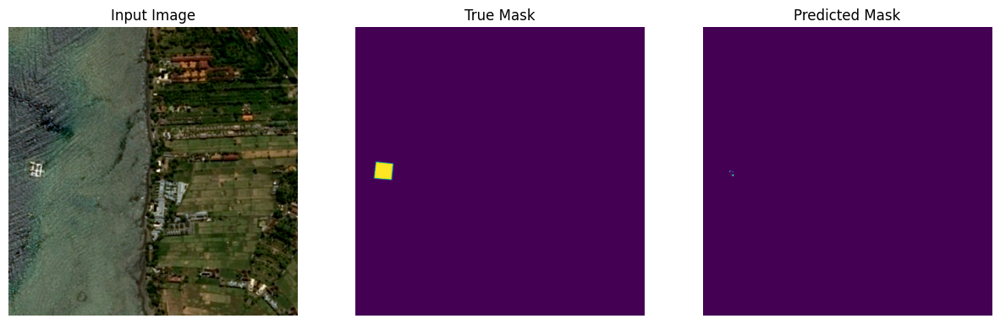

In [45]:
# sample image and mask to display model predictions during training
for item in train_ds.unbatch().take(1):
    sample_image, sample_mask = item[0], item[1]
_display([sample_image, sample_mask, model.predict(tf.expand_dims(sample_image, axis=0))[0]])

/tmp/ipykernel_34/1331907227.py:87: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  self.base_model = keras.applications.MobileNetV2(
/opt/conda/lib/python3.10/site-packages/keras/src/optimizers/base_optimizer.py:664: UserWarning: Gradients do not exist for variables ['gamma', 'beta', 'kernel', 'gamma', 'beta'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(


399/399 ━━━━━━━━━━━━━━━━━━━━ 486s 942ms/step - dice_score: 0.7439 - loss: 0.2548


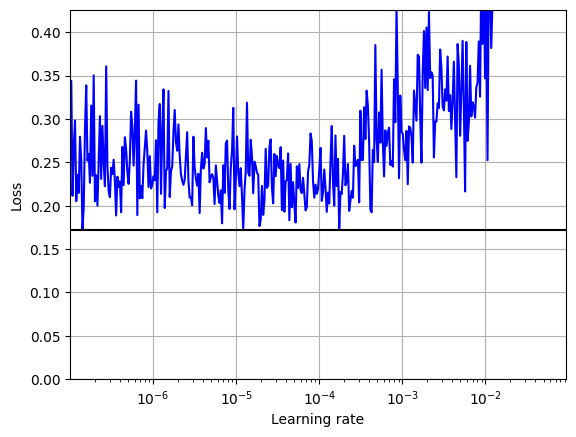

In [46]:
# load pretrained model, unfreeze the weights
model = keras.models.load_model("models/segmentator_pretrained.keras", compile=False)

model.layers[1].trainable = True
for layer in model.layers[1].layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer="adam", metrics=[dice_score])

# find an optimal learning rate for fine-tuning
rates, losses = find_learning_rate(model, train_ds.take(400), epochs=1,
                                   batch_size=batch_size, min_rate=1e-7, max_rate=1e-1)
plot_lr_vs_loss(rates, losses) 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


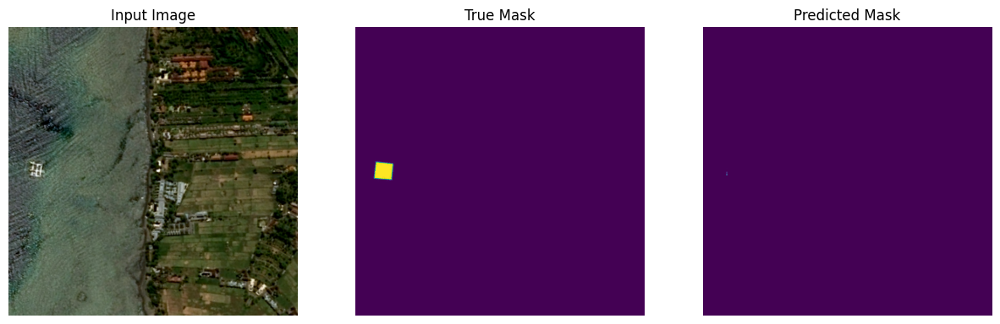


Sample Prediction after epoch 8

809/809 ━━━━━━━━━━━━━━━━━━━━ 744s 920ms/step - dice_score: 0.8322 - loss: 0.2036 - val_dice_score: 0.8460 - val_loss: 0.1956


In [47]:
# fine-tuning
# create LR scheduling
epochs = 8
batch_size = 64
steps_per_epoch = len(train_image_paths) // batch_size
num_train_steps = steps_per_epoch * epochs
warmup_steps = int(0.1 * num_train_steps)
initial_learning_rate = 1e-4
warmup_schedule = TriangularScheduler(initial_learning_rate, warmup_steps, num_train_steps)

# callback to save model along the way
model_path = "models/segmentator_FT_384.keras"
checkpoint = keras.callbacks.ModelCheckpoint(
    model_path, monitor='val_dice_score', 
    verbose=1, save_best_only=True, mode='max')
callbacks = [checkpoint, DisplayCallback()]

# train model further using LR annealing
model = keras.models.load_model("models/segmentator_pretrained.keras", compile=False)
model.layers[1].trainable = True
for layer in model.layers[1].layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False
        
optimizer = keras.optimizers.Adam(learning_rate=warmup_schedule)
model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer=optimizer, metrics=[dice_score])
history = model.fit(
    train_ds,
    steps_per_epoch=steps_per_epoch,
    epochs=epochs,
    validation_data=valid_ds,
    batch_size=batch_size,
    callbacks=callbacks,
)

### Fine-Tuning (512x512)

1. Prepare the data (images are resized to the 512x512 size, while reducing the batch size to 16)
2. Load the fine-tuned on 384x384 images model, unfreeze its weights (except for BatchNormalization layers)
3. Find an optimal LR specifically for the fine-tuning process and dataset, set up the LR scheduler 
4. Fine-tune the model
5. Save the best model

In [23]:
batch_size = 16
patch_size = None
size = 512
mask_dir = "/kaggle/working/"

train_image_paths, train_mask_paths = get_image_mask_path(train_ids, image_dir=train_dir, mask_dir=mask_dir)
valid_image_paths, valid_mask_path = get_image_mask_path(valid_ids, image_dir=train_dir, mask_dir=mask_dir)

# get batched training set
train_ds = get_dataset(train_image_paths, train_mask_paths, patch_size=patch_size, size=size, batch_size=batch_size, shuffle=True)
train_ds = train_ds.map(
    Augment(), 
    num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE).repeat()

# prepare validation set normally
valid_ds = get_dataset(valid_image_paths, valid_mask_path, patch_size=patch_size, size=size, batch_size=batch_size)
valid_ds = valid_ds.prefetch(tf.data.AUTOTUNE)

/tmp/ipykernel_34/1331907227.py:87: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  self.base_model = keras.applications.MobileNetV2(


299/299 ━━━━━━━━━━━━━━━━━━━━ 328s 737ms/step - dice_score: 0.7779 - loss: 0.2311


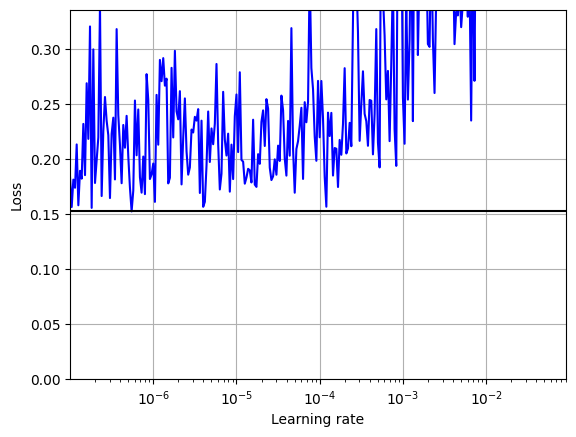

In [49]:
# load pretrained model, unfreeze the weights
model = keras.models.load_model("models/segmentator_FT_384.keras", compile=False)

model.layers[1].trainable = True
for layer in model.layers[1].layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer="adam", metrics=[dice_score])

# find an optimal learning rate for fine-tuning
rates, losses = find_learning_rate(model, train_ds.take(300), epochs=1,
                                   batch_size=batch_size, min_rate=1e-7, max_rate=1e-1)
plot_lr_vs_loss(rates, losses) 

In [24]:
# fine-tuning
# create LR scheduling
epochs = 2
batch_size = 16
steps_per_epoch = len(train_image_paths) // batch_size
num_train_steps = steps_per_epoch * epochs
warmup_steps = int(0.1 * num_train_steps)
initial_learning_rate = 1e-4
warmup_schedule = TriangularScheduler(initial_learning_rate, warmup_steps, num_train_steps)

# callback to save model along the way
model_path = "models/segmentator_FT_512.keras"
checkpoint = keras.callbacks.ModelCheckpoint(
    model_path, monitor='val_dice_score', 
    verbose=1, save_best_only=True, mode='max')
callbacks = [checkpoint]

# train model further using LR annealing
model = keras.models.load_model("models/segmentator_FT_384.keras", compile=False)
model.layers[1].trainable = True
for layer in model.layers[1].layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False
        
optimizer = keras.optimizers.Adam(learning_rate=warmup_schedule)
model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer=optimizer, metrics=[dice_score])
history = model.fit(
    train_ds,
    steps_per_epoch=steps_per_epoch,
    epochs=epochs,
    validation_data=valid_ds,
    batch_size=batch_size,
    callbacks=callbacks,
)

/tmp/ipykernel_548/1688358713.py:87: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  self.base_model = keras.applications.MobileNetV2(


Epoch 1/2


/opt/conda/lib/python3.10/site-packages/keras/src/optimizers/base_optimizer.py:664: UserWarning: Gradients do not exist for variables ['gamma', 'beta', 'kernel', 'gamma', 'beta'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
I0000 00:00:1724602063.310416     589 service.cc:145] XLA service 0x796c88217a00 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1724602063.310478     589 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1724602063.310483     589 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1724602107.028209     589 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3237/3237 ━━━━━━━━━━━━━━━━━━━━ 0s 530ms/step - dice_score: 0.8105 - loss: 0.2156
Epoch 1: val_dice_score improved from -inf to 0.83984, saving model to models/segmentator_FT_512.keras
3237/3237 ━━━━━━━━━━━━━━━━━━━━ 1839s 548ms/step - dice_score: 0.8105 - loss: 0.2156 - val_dice_score: 0.8398 - val_loss: 0.1972
Epoch 2/2
3237/3237 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - dice_score: 0.8221 - loss: 0.2080
Epoch 2: val_dice_score improved from 0.83984 to 0.84661, saving model to models/segmentator_FT_512.keras
3237/3237 ━━━━━━━━━━━━━━━━━━━━ 1730s 535ms/step - dice_score: 0.8221 - loss: 0.2080 - val_dice_score: 0.8466 - val_loss: 0.1935


### Fine-Tuning (768x768)

1. Create a dataset of original images of 768x768 size, batch size = 16)
2. Load the fine-tuned on 512x512 images model, unfreeze its weights (except for BatchNormalization layers)
3. Find an optimal LR specifically for the fine-tuning process and dataset, set up the LR scheduler 
4. Fine-tune the model
5. Save the best model

In [22]:
batch_size = 16
patch_size = None
size = 768
mask_dir = "/kaggle/working/"

train_image_paths, train_mask_paths = get_image_mask_path(train_ids, image_dir=train_dir, mask_dir=mask_dir)
valid_image_paths, valid_mask_path = get_image_mask_path(valid_ids, image_dir=train_dir, mask_dir=mask_dir)

# get batched training set
train_ds = get_dataset(train_image_paths, train_mask_paths, patch_size=patch_size, size=size, batch_size=batch_size, shuffle=False)
train_ds = train_ds.map(
    Augment(), 
    num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE).repeat()

# prepare validation set normally
valid_ds = get_dataset(valid_image_paths, valid_mask_path, patch_size=patch_size, size=size, batch_size=batch_size)
valid_ds = valid_ds.prefetch(tf.data.AUTOTUNE)

/tmp/ipykernel_394/1688358713.py:87: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  self.base_model = keras.applications.MobileNetV2(
/opt/conda/lib/python3.10/site-packages/keras/src/optimizers/base_optimizer.py:664: UserWarning: Gradients do not exist for variables ['gamma', 'beta', 'kernel', 'gamma', 'beta'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
I0000 00:00:1724532385.465065     438 service.cc:145] XLA service 0x7c7f9c019bc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1724532385.465132     438 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1724532385.465139     438 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1724532463.280814     438 asm_compil

299/299 ━━━━━━━━━━━━━━━━━━━━ 446s 1s/step - dice_score: 0.7642 - loss: 0.2410


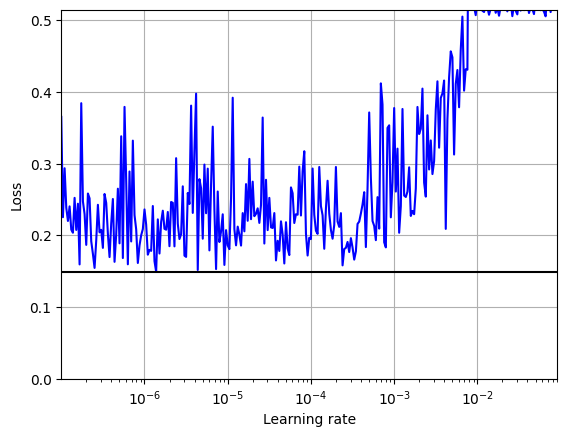

In [23]:
# load pretrained model, unfreeze the weights
model = keras.models.load_model("models/segmentator_FT_512.keras", compile=False)

model.layers[1].trainable = True
for layer in model.layers[1].layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer="adam", metrics=[dice_score])

# find an optimal learning rate for fine-tuning
rates, losses = find_learning_rate(model, train_ds.take(300), epochs=1,
                                   batch_size=batch_size, min_rate=1e-7, max_rate=1e-1)
plot_lr_vs_loss(rates, losses) 

In [35]:
# fine-tuning
# create LR scheduling
epochs = 2
steps_per_epoch = len(train_image_paths) // batch_size
num_train_steps = steps_per_epoch * epochs
warmup_steps = int(0.1 * num_train_steps)
initial_learning_rate = 5e-5
warmup_schedule = TriangularScheduler(initial_learning_rate, warmup_steps, num_train_steps)

# callback to save model along the way
model_path = "models/segmentator_FT_768.keras"
checkpoint = keras.callbacks.ModelCheckpoint(
    model_path, monitor='val_dice_score', 
    verbose=1, save_best_only=True, mode='max')
callbacks = [checkpoint]

# train model further using LR annealing
model = keras.models.load_model("models/segmentator_FT_512.keras", compile=False)
model.layers[1].trainable = True
for layer in model.layers[1].layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False
        
optimizer = keras.optimizers.Adam(learning_rate=warmup_schedule)
model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer=optimizer, metrics=[dice_score])
history = model.fit(
    train_ds,
    steps_per_epoch=steps_per_epoch,
    epochs=epochs,
    validation_data=valid_ds,
    batch_size=batch_size,
    callbacks=callbacks,
)

/tmp/ipykernel_729/1688358713.py:87: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  self.base_model = keras.applications.MobileNetV2(


Epoch 1/2


I0000 00:00:1724620628.767541     771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_multiply_reduce_fusion_1', 8 bytes spill stores, 12 bytes spill loads



3237/3237 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - dice_score: 0.8140 - loss: 0.2139
Epoch 1: val_dice_score improved from -inf to 0.84277, saving model to models/segmentator_FT_768.keras
3237/3237 ━━━━━━━━━━━━━━━━━━━━ 3983s 1s/step - dice_score: 0.8140 - loss: 0.2139 - val_dice_score: 0.8428 - val_loss: 0.1947
Epoch 2/2
3237/3237 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - dice_score: 0.8327 - loss: 0.2018
Epoch 2: val_dice_score improved from 0.84277 to 0.85034, saving model to models/segmentator_FT_768.keras
3237/3237 ━━━━━━━━━━━━━━━━━━━━ 3939s 1s/step - dice_score: 0.8327 - loss: 0.2018 - val_dice_score: 0.8503 - val_loss: 0.1908


### Compare fine-tuned models

In [27]:
from IPython.display import clear_output

def display(display_list, title=['Input Image', 'True Mask', 'Predicted Mask']):
    """Function to plot [image, mask, mask] triplets"""
    plt.figure(figsize=(15, 15))
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(keras.utils.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()
    
def display_test(display_list):
    """Function to plot [image, mask] pairs"""
    plt.figure(figsize=(10, 10))
    title = ['Input Image', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(keras.utils.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_predictions(model, dataset, num=1, threshold=0.3, testing=False):
    """
    Display predictions made by the model on the dataset.

    Parameters:
    - model: The trained model for making predictions.
    - dataset: The dataset containing images and corresponding masks.
    - num (int): Number of samples to display predictions for (default is 1).
    - threshold (float): Threshold value for binarizing prediction masks (default is 0.3).
    - testing (bool): If True, display predictions without ground truth masks (default is False).
    """
    if testing:
        for image in dataset.unbatch().take(num):
            pred_mask = model.predict(tf.expand_dims(image, axis=0), verbose=0)
            display_test([image, pred_mask[0] > threshold])
    else: 
        for image, mask in dataset.unbatch().take(num):
            pred_mask = model.predict(tf.expand_dims(image, axis=0), verbose=0)
            display([image, mask, pred_mask[0] > threshold])

/tmp/ipykernel_729/1688358713.py:87: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  self.base_model = keras.applications.MobileNetV2(


359/359 ━━━━━━━━━━━━━━━━━━━━ 127s 341ms/step - dice_score: 0.7200 - loss: 0.2738


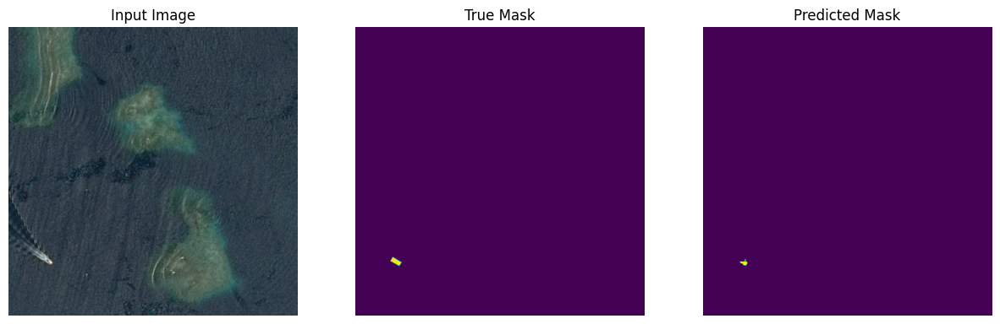

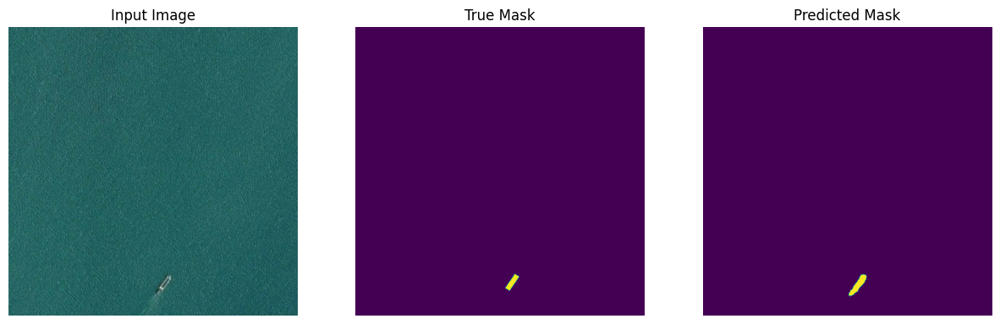

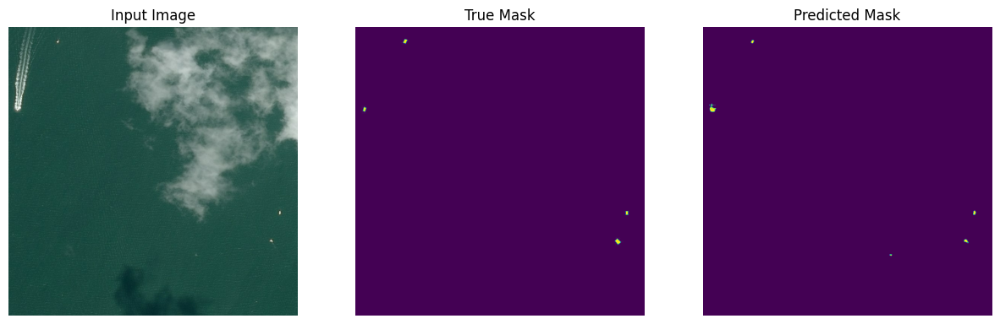

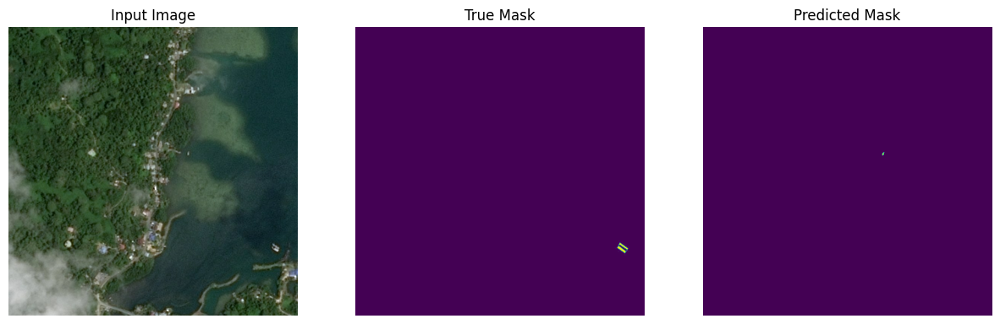

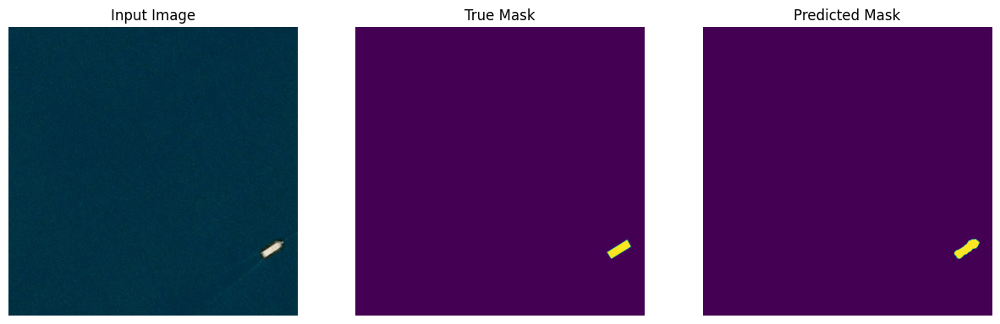

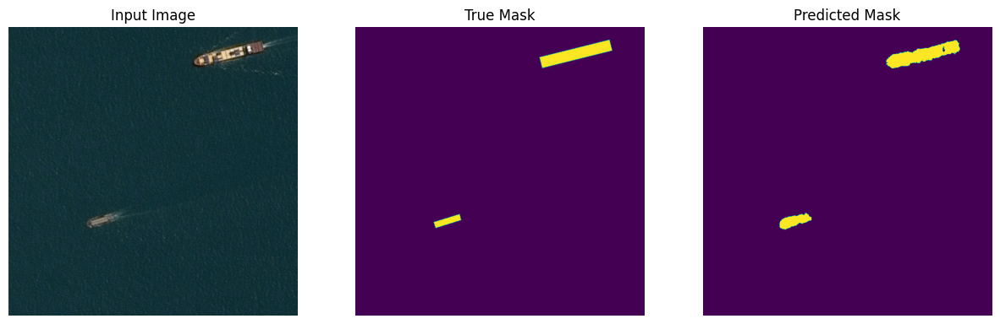

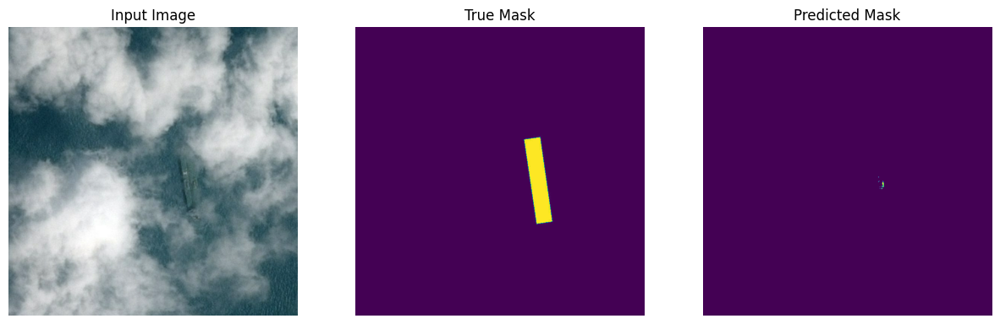

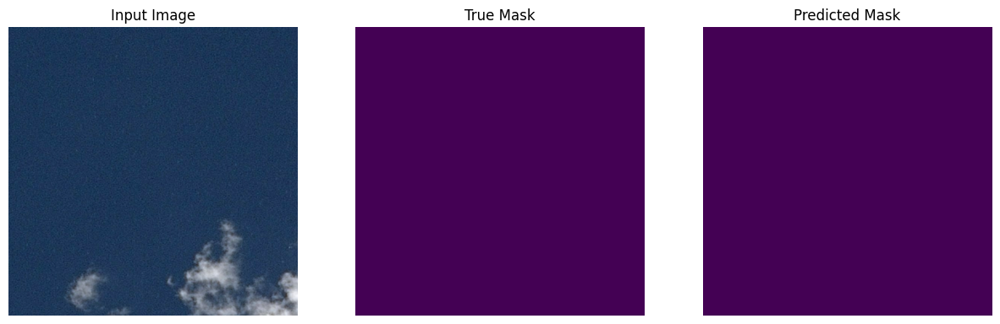

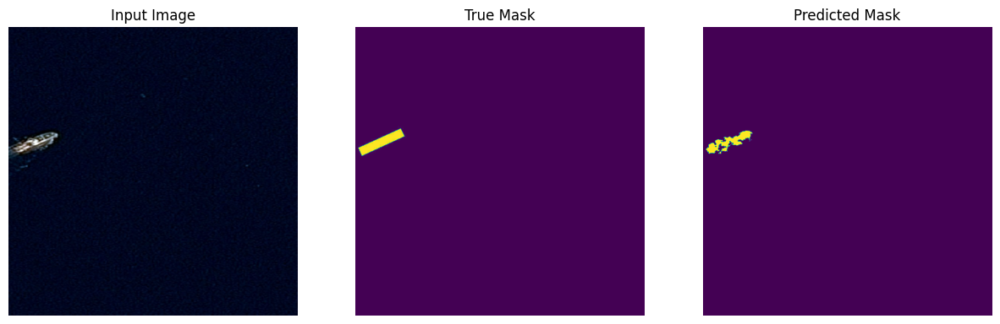

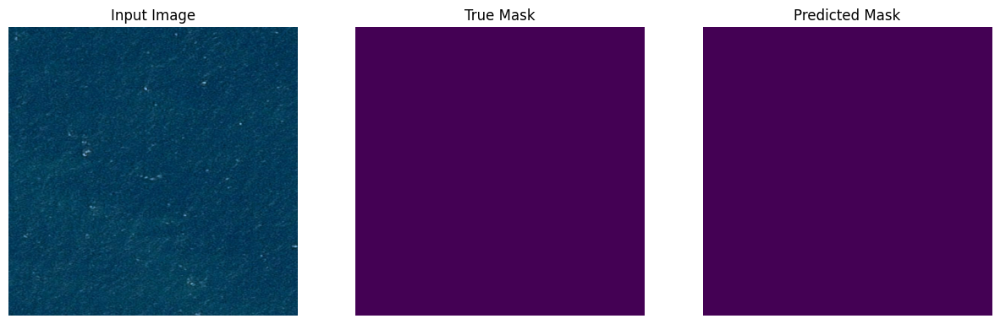

In [28]:
# load fine-tuned model 
model = keras.models.load_model("models/segmentator_FT_384.keras", compile=False)
model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer=optimizer, metrics=[dice_score])

model.evaluate(valid_ds)
show_predictions(model, valid_ds, num=10, threshold=0.4)

/tmp/ipykernel_729/1688358713.py:87: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  self.base_model = keras.applications.MobileNetV2(


359/359 ━━━━━━━━━━━━━━━━━━━━ 124s 335ms/step - dice_score: 0.8148 - loss: 0.2157


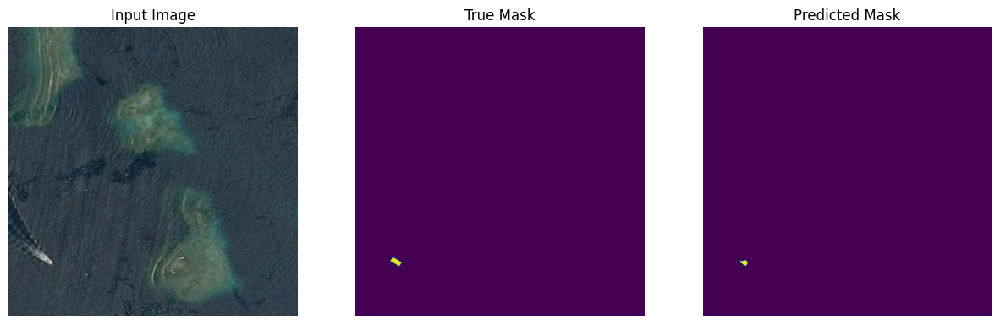

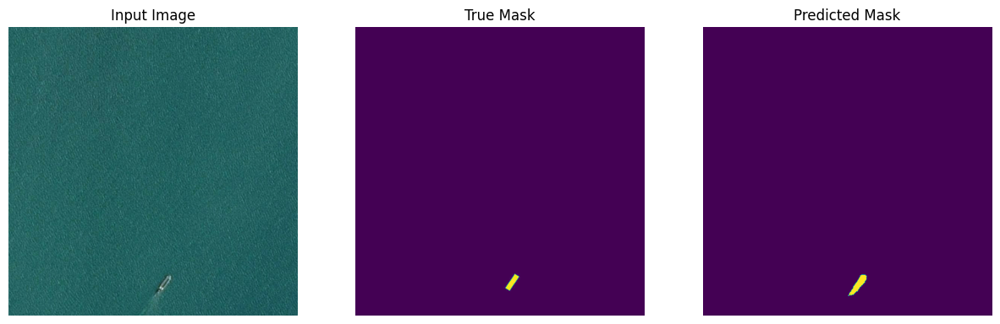

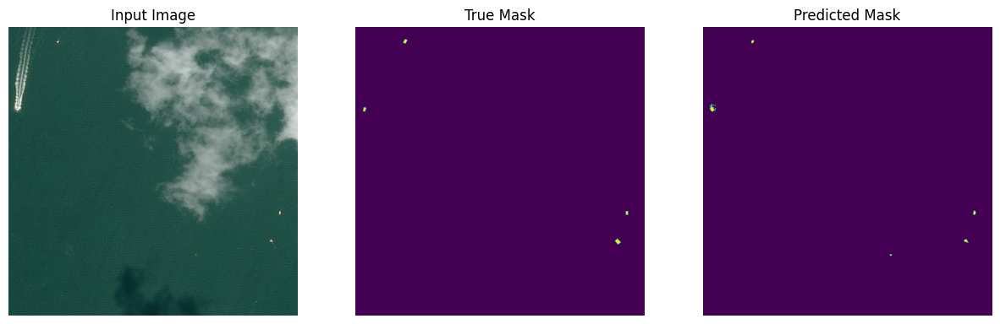

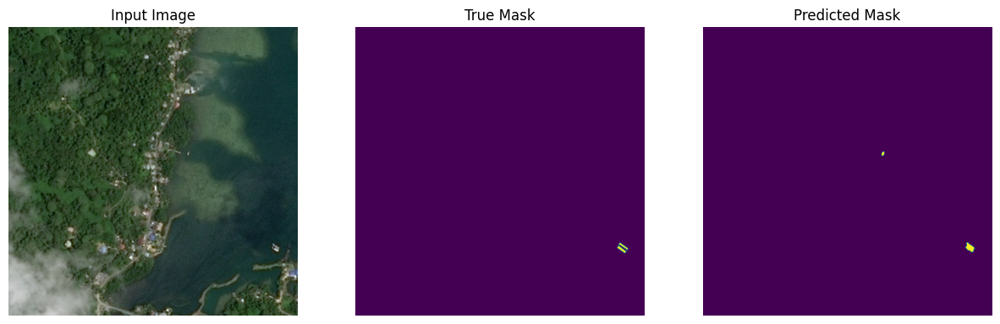

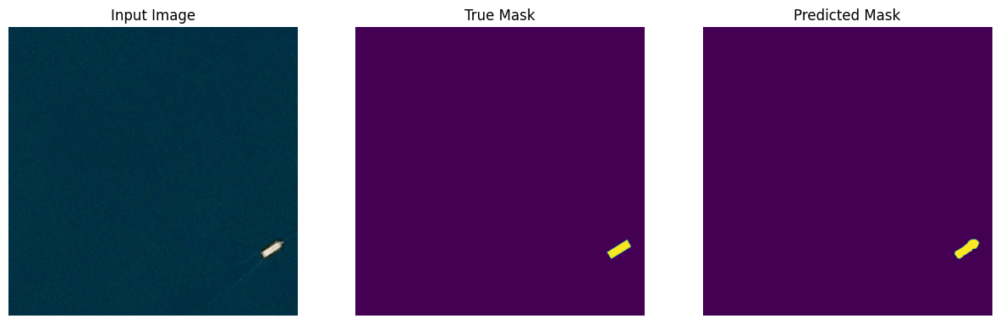

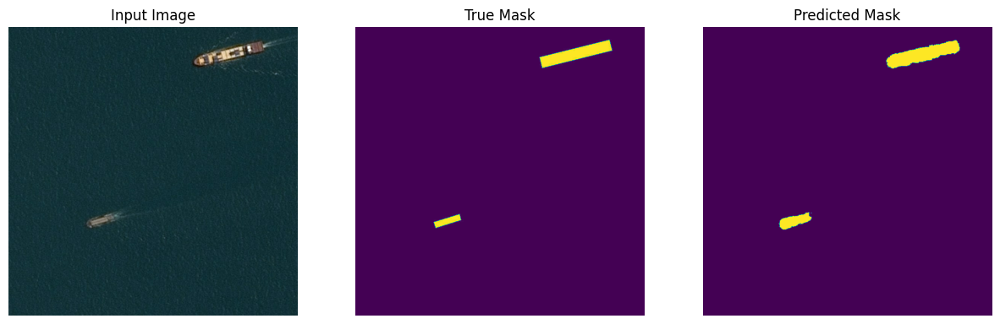

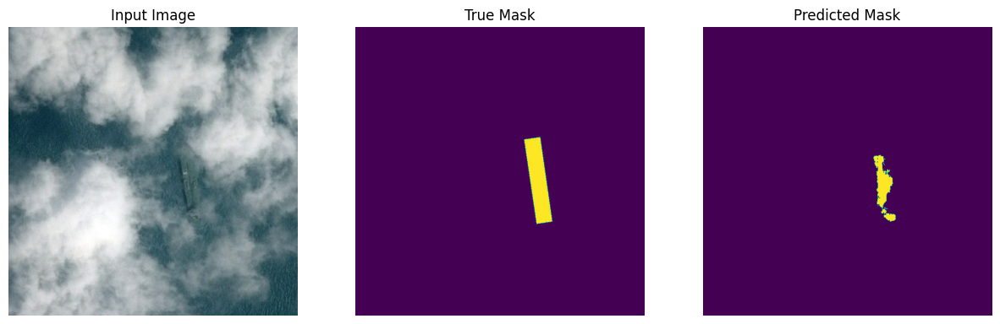

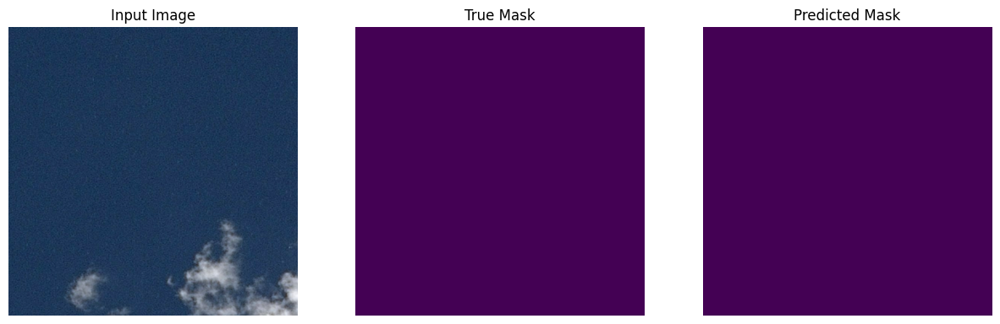

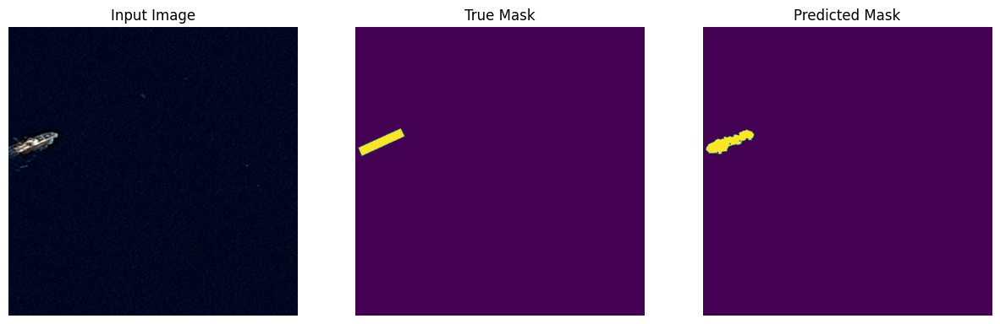

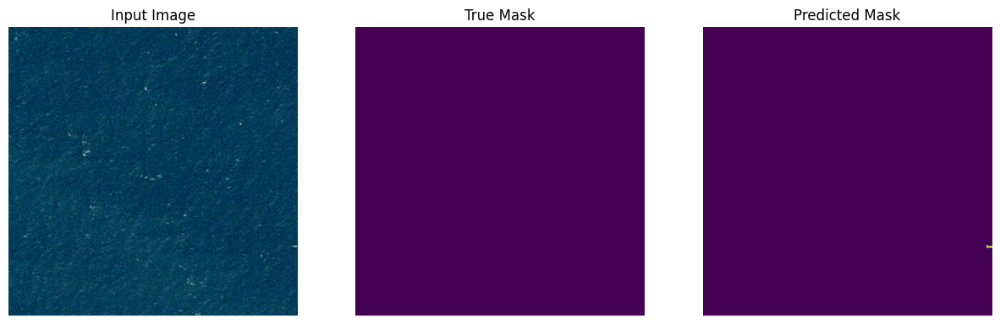

In [29]:
# load fine-tuned model 
model = keras.models.load_model("models/segmentator_FT_512.keras", compile=False)
model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer=optimizer, metrics=[dice_score])

model.evaluate(valid_ds)
show_predictions(model, valid_ds, num=10, threshold=0.4)

/tmp/ipykernel_729/1688358713.py:87: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  self.base_model = keras.applications.MobileNetV2(


359/359 ━━━━━━━━━━━━━━━━━━━━ 124s 334ms/step - dice_score: 0.8451 - loss: 0.1936


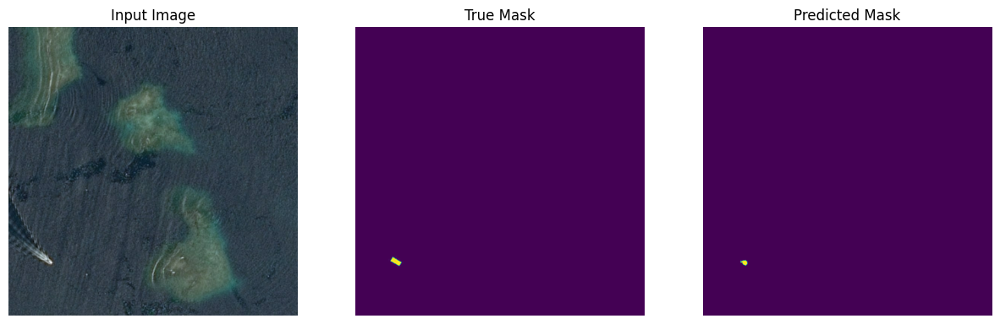

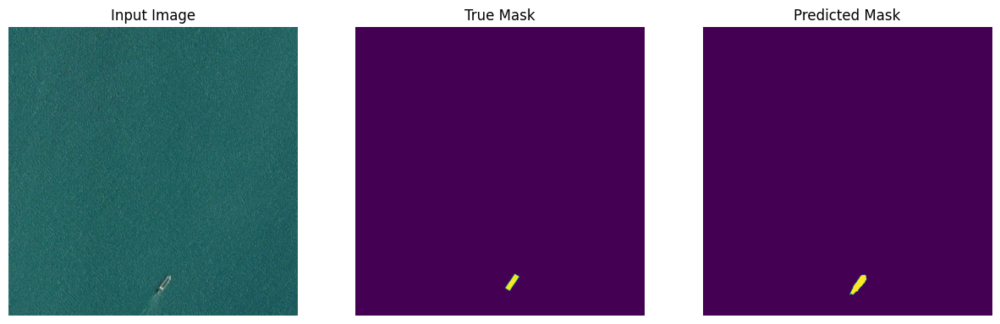

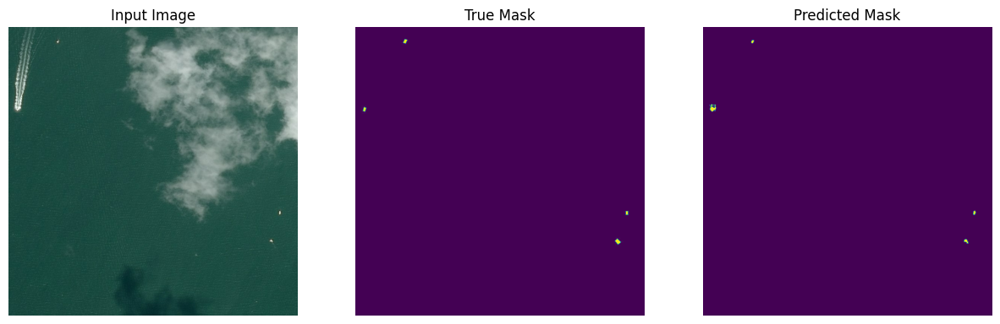

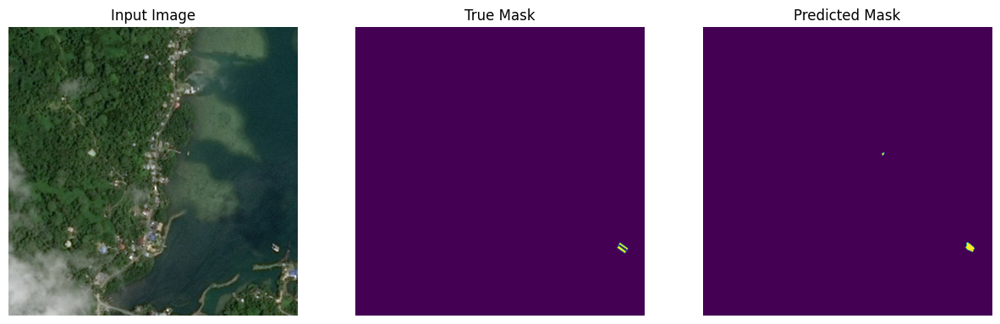

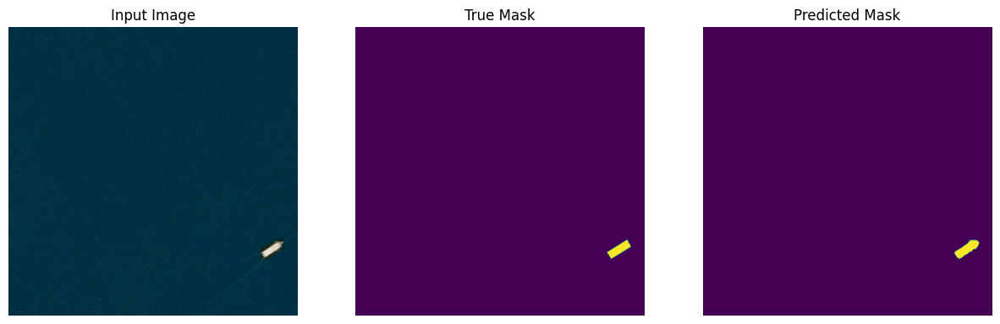

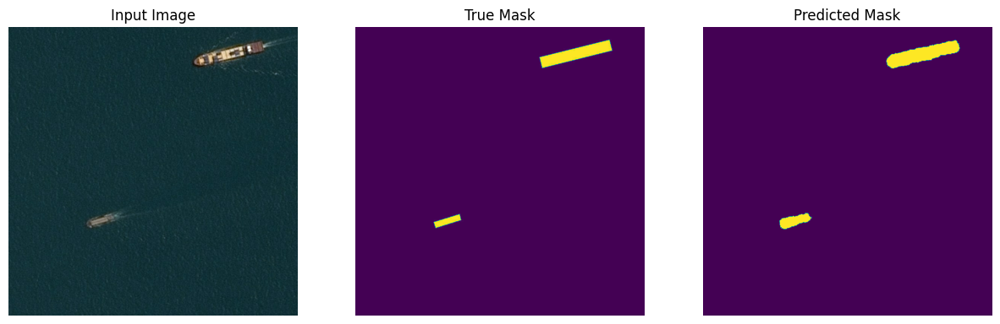

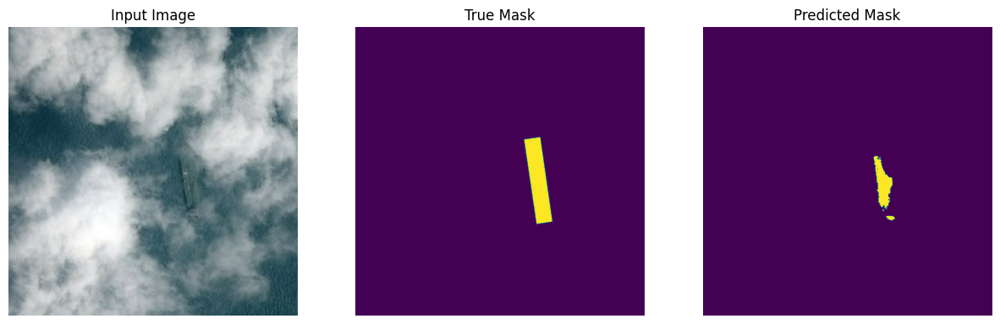

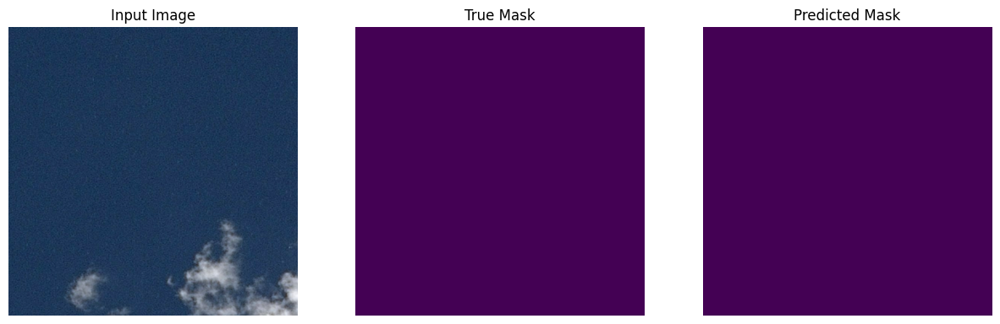

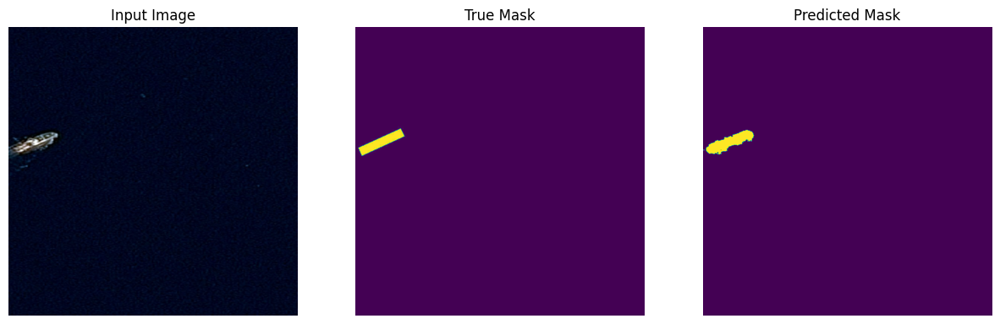

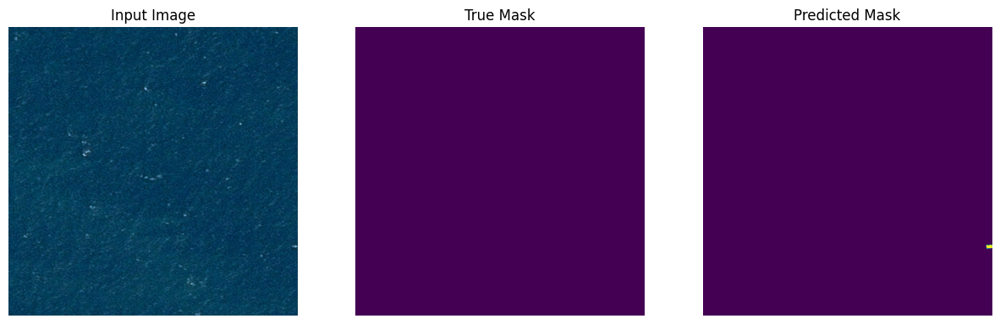

In [37]:
# load fine-tuned model 
model = keras.models.load_model("models/segmentator_FT_768.keras", compile=False)
model.compile(loss=SymmetricUnifiedFocalLoss(gamma=tuned_gamma), optimizer=optimizer, metrics=[dice_score])

model.evaluate(valid_ds)
show_predictions(model, valid_ds, num=10, threshold=0.4)

### Test images inference

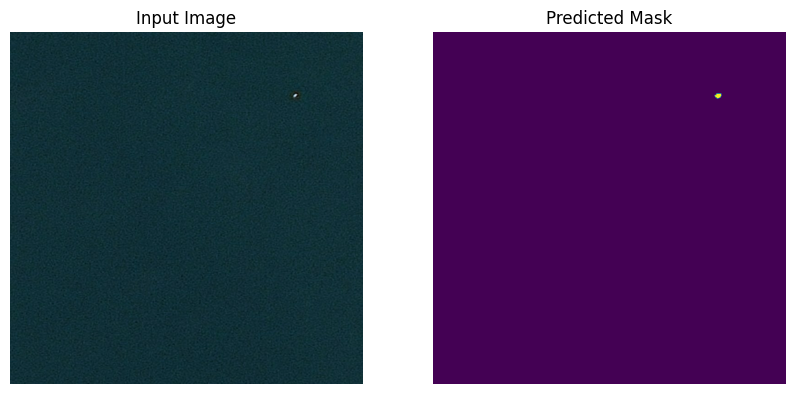

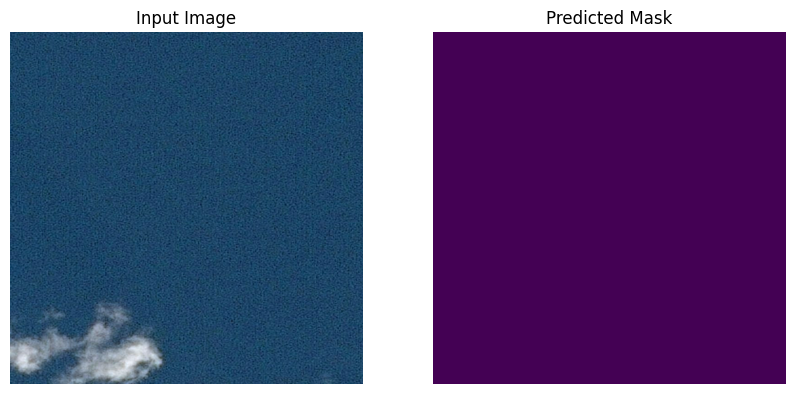

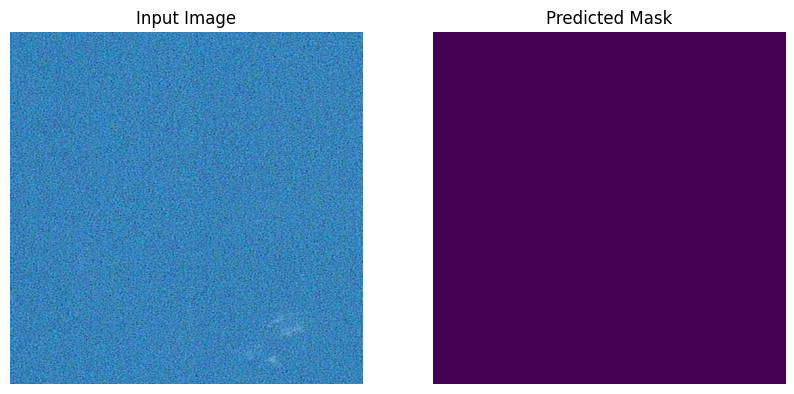

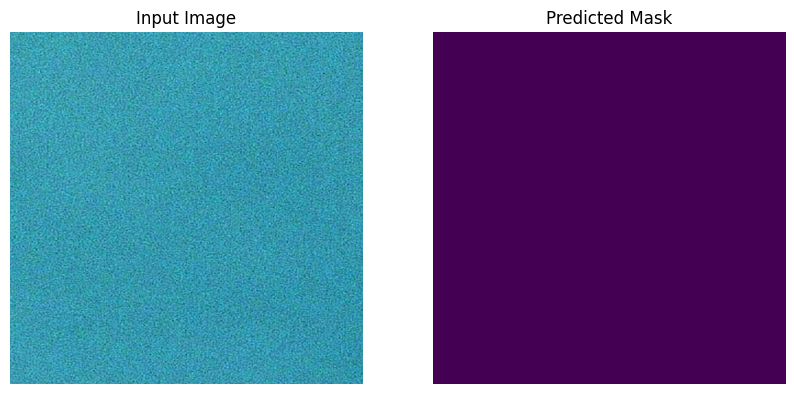

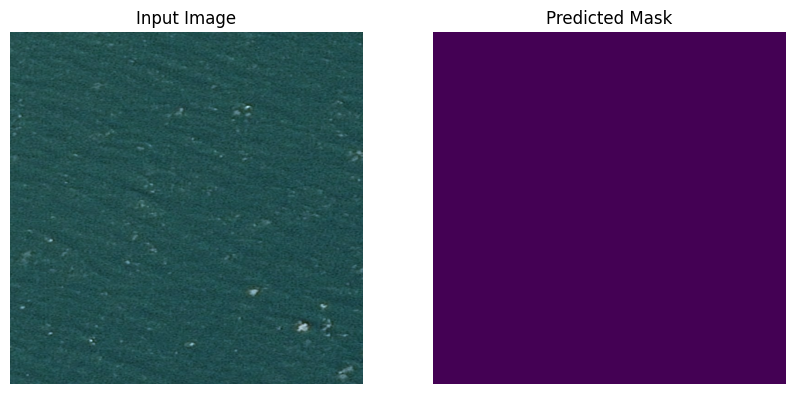

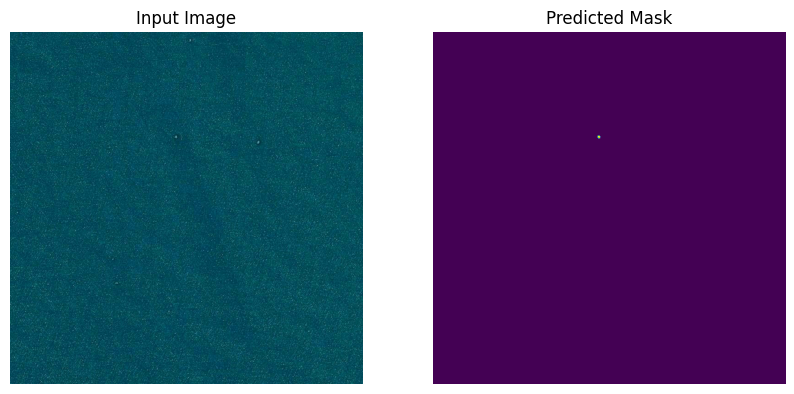

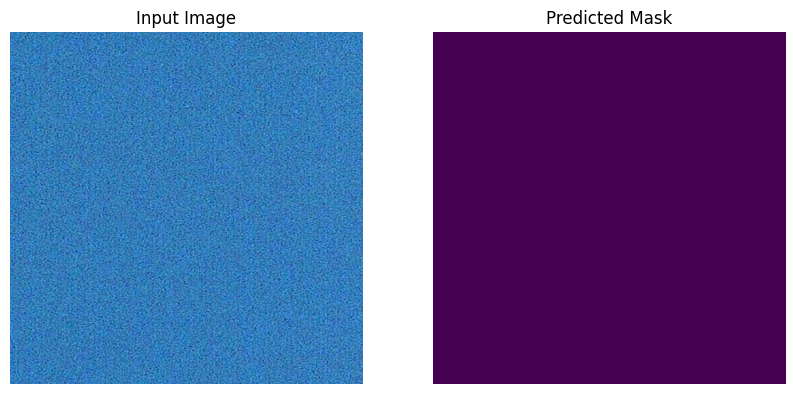

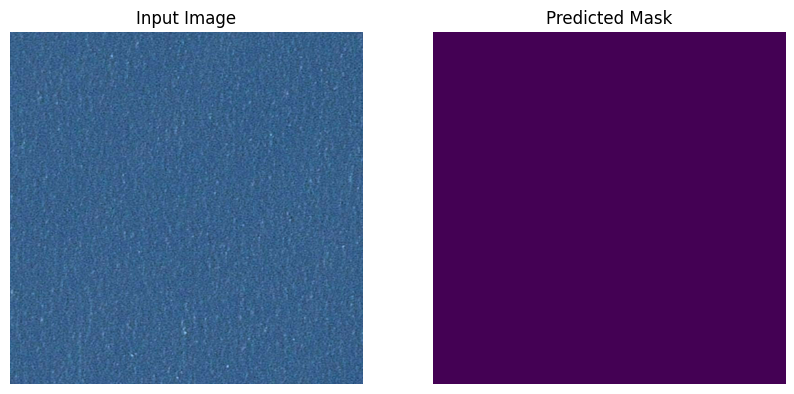

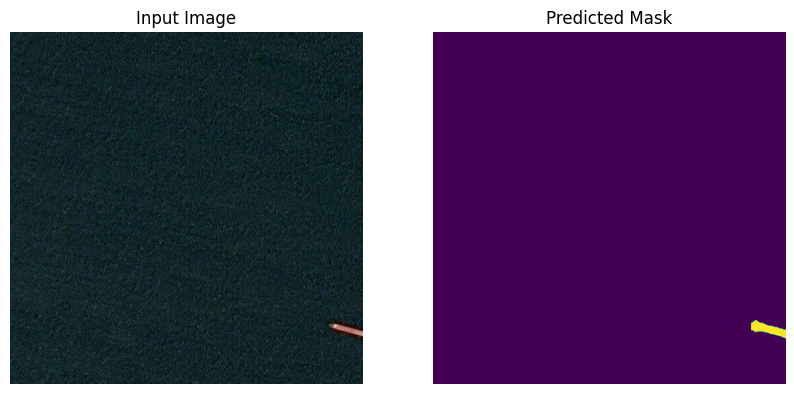

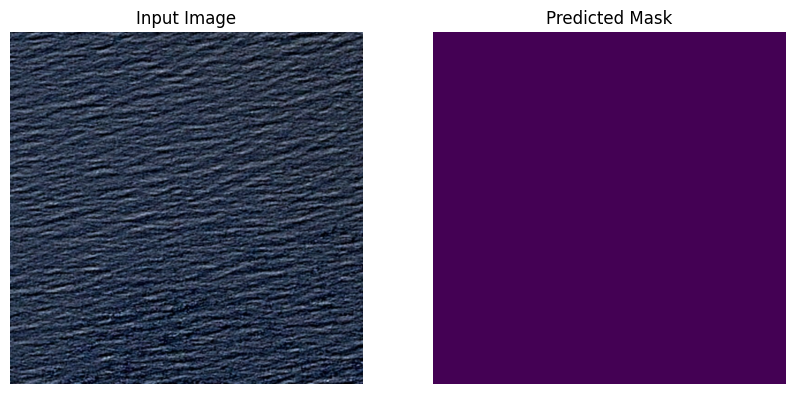

In [38]:
# get 10 random images from test dataset
ds = get_test_dataset(test_dir).batch(1).take(10)

show_predictions(model, ds, num=10, testing=True)

## Results

A staged model training process consisting of two pretraining rounds: classification and segmentation of low-resolution images, followed by three fine-tuning rounds on the same images with consistently increased resolutions (384 -> 512 -> 768), achieved a dice score of 0.85.